 <center> <h1> <b> Pattern Recognition and Machine Learning (EE5610 - EE2802 - AI2000 - AI5000) </b> </h1> </center>

<b> Programming Assignment - 03 : Classification</b>


This programming assignment offers you an opportunity to implement various linear classification models. You'll begin with straightforward algorithms like Least Squares classification, LDA, and FDA. Subsequently, you'll delve into implementing the perceptron algorithm. Lastly, you'll tackle probabilistic approaches for classification. To deepen your understanding of these methods, you'll compare their performance and application scenarios critically.

<b> Instructions </b>
1. Plagiarism is strictly prohibited.
2. Delayed submissions will be penalized with a scaling factor of 0.5 per day.
3. Please DO NOT use any machine learning libraries unless and otherwise specified.








**Part-1) Least squares approach to classification**

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Find the decision boundary: Assign the target value "0" to all data points in class 1 and the target value "1" to all data points in class 2. Implement the pseudo-inverse solution to determine the weight vector, which represents the decision boundary.


c). Evaluate the quality of decision boundary: A decision boundary is deemed effective if it correctly classifies all data points. Accuracy measures the performance of a classification problem. Calculate the accuracy of the test data using the decision boundary obtained from the pseudo-inverse solution.


d). Visualize the decision boundary: You can either display the decision hyperplane or use different colors to distinguish regions corresponding to the two classes on a 2D plane. Superimpose the test points onto the decision boundary plot.

e). Assign the value "-1" to class1 and the value "+1" to class 2. Repeat the experiments.

f). Experiment with Laplacian distribution and compare the performance of it with the Gaussian distribution experiments

g. Report your observations.




In [2]:
#All imports
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import random
import math

training data shape: (100, 2)
training labels shape: (100,)
testing data shape: (400, 2)
testing labels shape: (400,)
(array([0., 1.]), array([50, 50]))
(array([0., 1.]), array([200, 200]))
Accuracy of the decision boundary: 0.5925


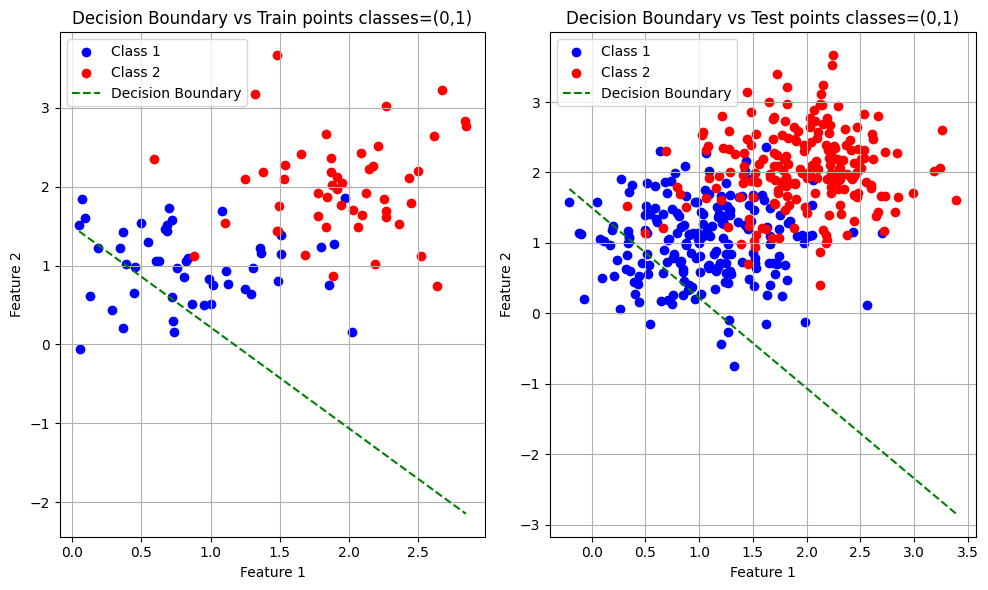

(array([-1,  1]), array([50, 50]))
(array([-1,  1]), array([200, 200]))
Accuracy with modified labels: 0.865


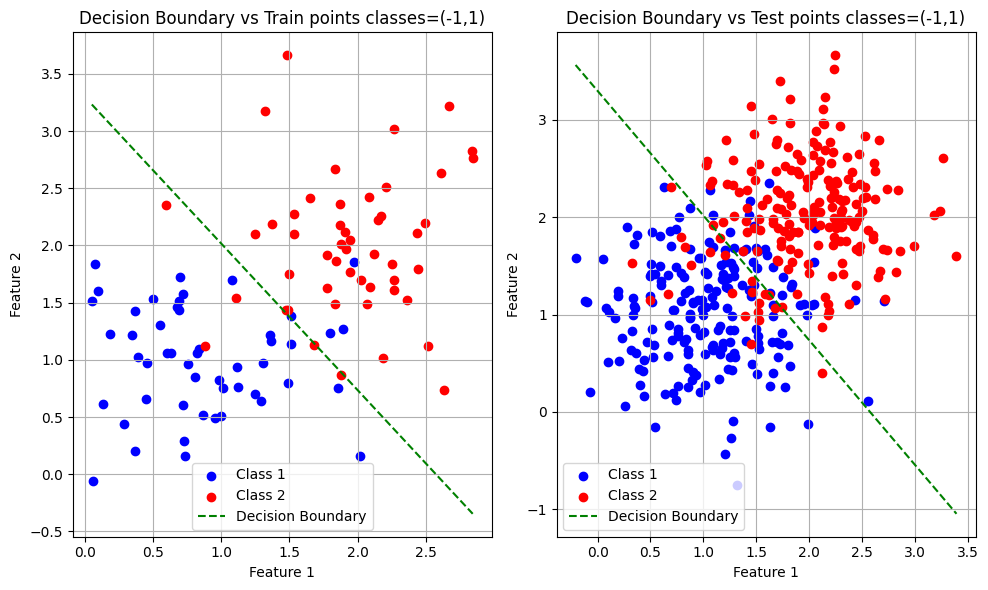

(array([0., 1.]), array([50, 50]))
(array([0., 1.]), array([200, 200]))
Accuracy with Laplacian distribution: 0.6225


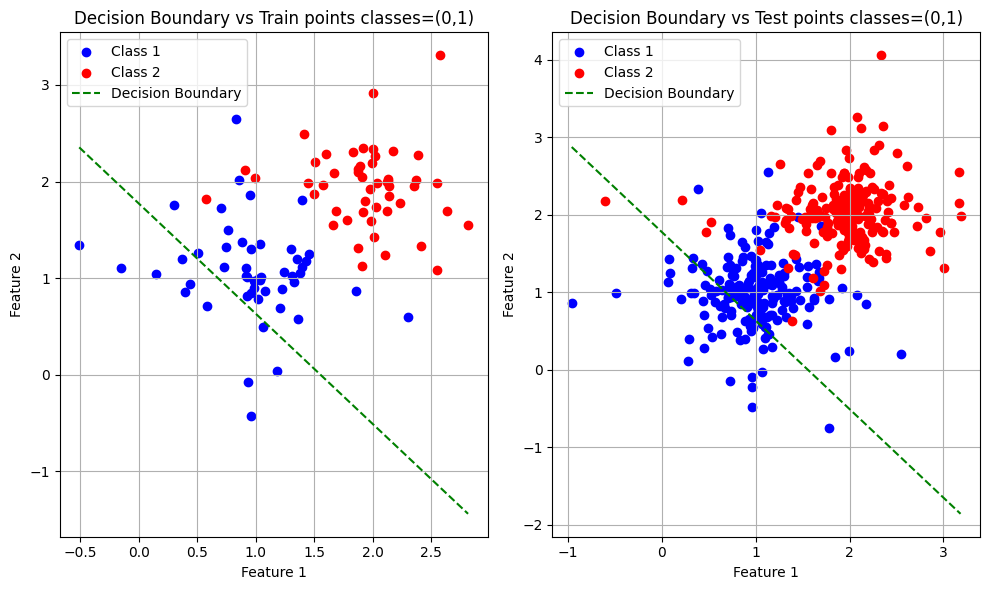

(array([-1.,  1.]), array([50, 50]))
(array([-1.,  1.]), array([200, 200]))
Accuracy with Laplacian distribution: 0.945


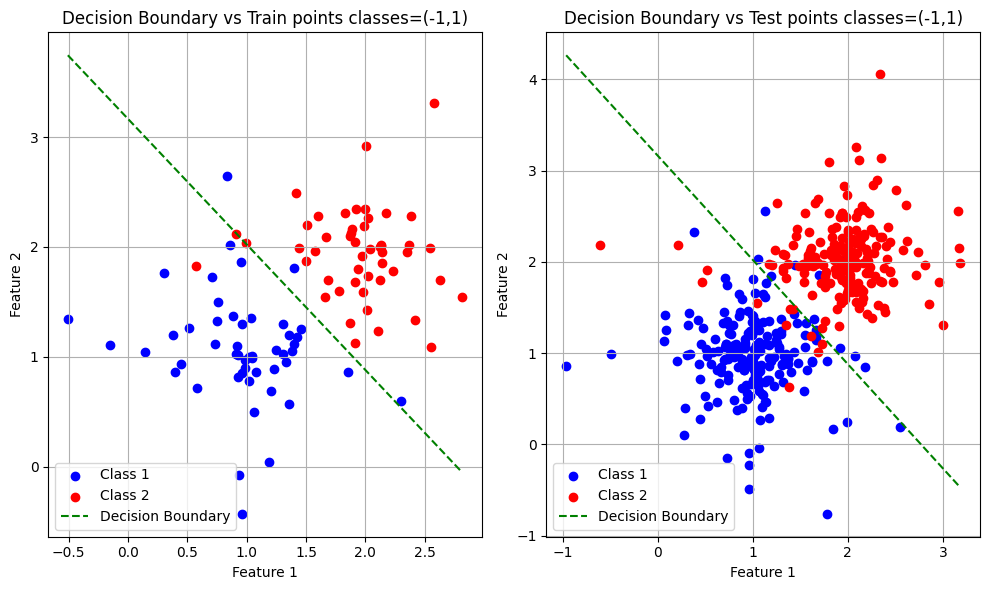

In [3]:

########################################
#Part-1)-a: Data generation
########################################

#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, 50)             #Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)            #Class2 training data
tr_data = np.vstack((class1_tr, class2_tr))              #Combine class1 training and class2 training data to get total training data
tr_targets = np.hstack((np.zeros(50), np.ones(50)))          #Class labels. Assign the value "0" to class1 and the value "1" to class2.
print("training data shape:", tr_data.shape)
print("training labels shape:", tr_targets.shape)
#Generate testing data.
class1_te =  np.random.multivariate_normal(mean1, cov, 200)           #Class1 testing data
class2_te =  np.random.multivariate_normal(mean2, cov, 200)           #Class2 testing data
te_data =  np.vstack((class1_te, class2_te))             #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.hstack((np.zeros(200), np.ones(200)))           #Class labels. Assign the value "0" to class1 and the value "1" to class2.
print("testing data shape:", te_data.shape)
print("testing labels shape:", te_targets.shape)
print(np.unique(tr_targets, return_counts=True))
print(np.unique(te_targets, return_counts=True))
########################################
#Part-1)-b: Find the decision boundary
########################################
#Complete the below function
def LS_Classify(X_train, Y_train, X_test,order,threshold=0):
    #Inputs: Training data, Training labels, and Testing data
    #Outputs: Testing labels
    #Impliment pseudo inverse solution to get the weight vector
    X_train = np.concatenate([np.ones((X_train.shape[0], 1)), X_train], axis=1)
    X_test = np.concatenate([np.ones((X_test.shape[0], 1)), X_test], axis=1)
    W = np.linalg.inv((X_train.T @ X_train)) @ X_train.T @ Y_train
    #Predict the lables of test data using the pseudo inverse solution
    Y_test_ = X_test @ W
    # Return the predicted test labels
    if order==0:
     Y_test = np.where(Y_test_ >= threshold,1,0)
    else:
      Y_test = np.where(Y_test_ >= threshold,1,-1)
    return Y_test,W
#Get the test data predictions
predictions,W = LS_Classify(tr_data, tr_targets, te_data,0)

##########################################
#Part-1)-c: Evaluate the quality of decision boundary
##########################################
#Complete the below function
def LS_Classify_Accuracy(Y_test, Y_pred):
    #Inputs: Ground truth test labels and predicted test labels
    #Outputs: Accuracy
    #Compute the accuracy
    correct_predictions = (Y_test == np.round(Y_pred)).sum()
    accuracy = correct_predictions / len(Y_test)
    #Return the accuracy
    return accuracy
accuracy = LS_Classify_Accuracy(te_targets, predictions)
print("Accuracy of the decision boundary:", accuracy)

##########################################
#Part-1)-d: Visualize the decision boundary
##########################################
def plot_decision_boundary(X_train,Y_train,X_test, Y_test, weight_vector, order):
        plt.figure(figsize=(10,6))
        plt.subplot(1,2,2)
        if order == 0:
            plt.scatter(X_test[Y_test == 0][:, 0], X_test[Y_test == 0][:, 1], color='blue', label='Class 1')
            plt.scatter(X_test[Y_test == 1][:, 0], X_test[Y_test == 1][:, 1], color='red', label='Class 2')
        if order == 1:
            plt.scatter(X_test[Y_test == -1][:, 0], X_test[Y_test == -1][:, 1], color='blue', label='Class 1')
            plt.scatter(X_test[Y_test == 1][:, 0], X_test[Y_test == 1][:, 1], color='red', label='Class 2')

        slope = -weight_vector[1] / weight_vector[2]  # -w1 / w2
        intercept = -weight_vector[0] / weight_vector[2]  # -w0 / w2
        # Calculate x values from the minimum to maximum of the first feature in the test data
        x_values1 = np.linspace(np.min(X_test[:, 0]), np.max(X_test[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values1 = slope * x_values1 + intercept
        plt.plot(x_values1, y_values1, color='green', linestyle='--', label='Decision Boundary')
        if order==1:
           plt.title('Decision Boundary vs Test points classes=(-1,1)')
        else:
            plt.title('Decision Boundary vs Test points classes=(0,1)')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.legend()
        plt.grid(True)
        plt.subplot(1,2,1)
        if order == 0:
            plt.scatter(X_train[Y_train == 0][:, 0], X_train[Y_train == 0][:, 1], color='blue', label='Class 1')
            plt.scatter(X_train[Y_train == 1][:, 0], X_train[Y_train == 1][:, 1], color='red', label='Class 2')
        if order == 1:
            plt.scatter(X_train[Y_train == -1][:, 0], X_train[Y_train == -1][:, 1], color='blue', label='Class 1')
            plt.scatter(X_train[Y_train == 1][:, 0], X_train[Y_train == 1][:, 1], color='red', label='Class 2')

        slope = -weight_vector[1] / weight_vector[2]  # -w1 / w2
        intercept = -weight_vector[0] / weight_vector[2]  # -w0 / w2
        # Calculate x values from the minimum to maximum of the first feature in the test data
        x_values2 = np.linspace(np.min(X_train[:, 0]), np.max(X_train[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values2 = slope * x_values2 + intercept
        
        plt.plot(x_values2, y_values2, color='green', linestyle='--', label='Decision Boundary')
        if order==1:
           plt.title('Decision Boundary vs Train points classes=(-1,1)')
        else:
            plt.title('Decision Boundary vs Train points classes=(0,1)')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

plot_decision_boundary(tr_data, tr_targets,te_data, te_targets, W,0)

##########################################
#Part-1)-e: Change the target label notation, and repeat the experiments
##########################################
tr_targets_modified = np.where(tr_targets == 0, -1, 1)
te_targets_modified = np.where(te_targets == 0, -1, 1)
print(np.unique(tr_targets_modified, return_counts=True))
print(np.unique(te_targets_modified, return_counts=True))
predictions_modified,W = LS_Classify(tr_data, tr_targets_modified, te_data,1)  # Using te_data instead of te_targets_modified
accuracy_modified = LS_Classify_Accuracy(te_targets_modified,predictions_modified)
print("Accuracy with modified labels:", accuracy_modified)
plot_decision_boundary(tr_data, tr_targets_modified, te_data, te_targets_modified, W, 1)

##########################################
#Part-1)-f: Repeat the experiments with Laplacial distribution
##########################################
# Parameters for Laplacian distribution (similar to Gaussian)
mean1 = [1, 1]            # Mean of class 1
mean2 = [2, 2]            # Mean of class 2
b = 0.3                   # Scale parameter for Laplacian distribution

# Generate training data from Laplacian distribution
class1_tr = np.random.laplace(mean1, b, (50, 2))
class2_tr = np.random.laplace(mean2, b, (50, 2))
tr_data_laplace = np.vstack((class1_tr, class2_tr))
tr_targets_laplace = np.hstack((np.zeros(50), np.ones(50)))  # Assigning labels as 0 and 1
tr_targets_laplace1 = np.hstack((-np.ones(50), np.ones(50)))  # Assigning labels as -1 and 1
# Generate testing data from Laplacian distribution
class1_te = np.random.laplace(mean1, b, (200, 2))
class2_te = np.random.laplace(mean2, b, (200, 2))
te_data_laplace = np.vstack((class1_te, class2_te))
te_targets_laplace = np.hstack((np.zeros(200), np.ones(200)))  # Assigning labels as 0 and 1
te_targets_laplace1 = np.hstack((-np.ones(200), np.ones(200)))  # Assigning labels as -1 and 1
print(np.unique(tr_targets_laplace, return_counts=True))
print(np.unique(te_targets_laplace, return_counts=True))
# Get the test data predictions with Laplacian distribution
predictions_laplace,W = LS_Classify(tr_data_laplace, tr_targets_laplace, te_data_laplace,0)
accuracy_laplace = LS_Classify_Accuracy(te_targets_laplace,predictions_laplace)
print("Accuracy with Laplacian distribution:", accuracy_laplace)
plot_decision_boundary(tr_data_laplace, tr_targets_laplace, te_data_laplace, te_targets_laplace, W,0)
print(np.unique(tr_targets_laplace1, return_counts=True))
print(np.unique(te_targets_laplace1, return_counts=True))
predictions_laplace1,W = LS_Classify(tr_data_laplace, tr_targets_laplace1, te_data_laplace,1)
accuracy_laplace1 = LS_Classify_Accuracy(te_targets_laplace1,predictions_laplace1)
print("Accuracy with Laplacian distribution:", accuracy_laplace1)
plot_decision_boundary(tr_data_laplace, tr_targets_laplace1, te_data_laplace, te_targets_laplace1, W,1)

<b> Report your observations </b>

1. The accuracy of labels (-1 and 1) is more than for the labels (0 and 1) in Gaussian distribution and also decision boundary is also better for the labels(-1 and 1)

2. The accuracy of labels (-1 and 1) is more than for the labels (0 and 1) in Laplacian distribution and also decision boundary is also better for the labels(-1 and 1)

3. Compared to Gaussian Distribution Laplacian distribution's experiement accuracy is more i.e 95.25% and Gaussian distribution experiement's accuracy is 91.75%





<b> Part - (2) :  Linear & Fisher Discriminant analysis : </b> In this segment of the programming task, you'll learn the technique of projecting data from higher-dimensional to lower-dimensional space using both Linear Discriminant Analysis and Fisher Discriminant Analysis.

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Projection using only the between-class covariance: Develop a function for performing projection from 2-D space to 1-D utilizing Linear Discriminant Analysis. It's important to emphasize that this method only considers the between-class covariance. Project the previously generated 2-D synthetic data into 1-D and conduct classification. Plot both the original and projected data points on the same graph.

c). Projection utilizing both between-class and within-class covariance: Create a function to perform projection from 2-D space to 1-D using Fisher Discriminant Analysis. It's essential to mention that this method considers both between-class covariance and within-class covariance. Project the previously generated 2-D synthetic data into 1-D and conduct classification. Plot both the original and projected data points on the same graph.

d). Extend Fisher discriminant analysis function to project the data from N dimenision to K dimension.

e). Report your observations.


(array([0., 1.]), array([50, 50]))
(array([0., 1.]), array([200, 200]))


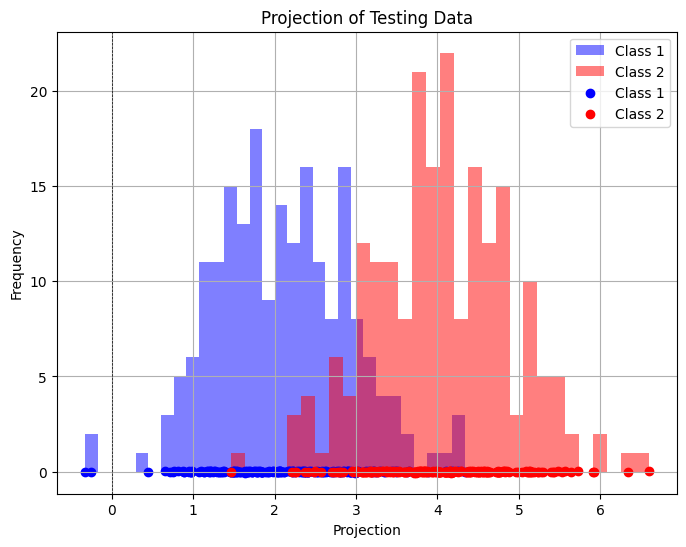

Accuracy with LDA: 89.25


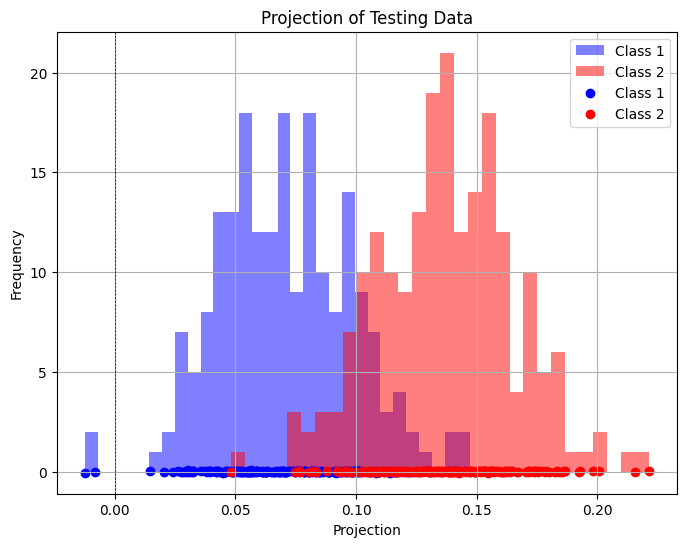

Accuracy with FDA: 89.5
Projection matrix: [[-0.70398034 -0.73977507]
 [-0.71021945  0.67285426]]
Projection matrix shape: (2, 2)


In [4]:
########################################
# Part-2)-(a): Data generation
########################################
# Set the parameters of class distribution
mean1 = [1, 1]           # Mean of class1
mean2 = [2, 2]           # Mean of class2
cov = [[0.3, 0], [0, 0.3]]  # Covariance matrix. Same covariance for class1 and class2

# Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, 50)  # Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)  # Class2 training data
tr_data = np.vstack((class1_tr, class2_tr))               # Combine class1 training and class2 training data to get total training data
tr_targets = np.hstack((np.zeros(50), np.ones(50)))       # Class labels. Assign the value "0" to class1 and the value "1" to class2.

# Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, 200)  # Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200)  # Class2 testing data
te_data = np.vstack((class1_te, class2_te))               # Combine class1 training and class2 training data to get total training data
te_targets = np.hstack((np.zeros(200), np.ones(200)))       # Class labels. Assign the value "0" to class1 and the value "1" to class2.
print(np.unique(tr_targets, return_counts=True))
print(np.unique(te_targets, return_counts=True))
########################################
#Part-2)-(b)
########################################
#Complete the below function
def LDA_classify(X_train, Y_train, X_test):
    # Inputs: Training data, Training labels, and Testing data
    # Outputs: Between class covariance
    mean1 = np.mean(X_train[Y_train == 0], axis=0)
    mean2 = np.mean(X_train[Y_train == 1], axis=0)
    # Compute the weight vector
    w = mean2 - mean1
    # Compute the threshold
    threshold = (np.dot(mean1, w) + np.dot(mean2, w)) / 2
    # Project the data onto 1 dimensional space. Compare it with the threshold to make the decision
    projections = np.dot(X_test, w)
    predictions = np.zeros(X_test.shape[0])
    for i in range(predictions.shape[0]):
      if projections[i] < threshold:
        predictions[i] = 0
      else:
        predictions[i] = 1
    # Return weight vector and the predictions on testing data
    return predictions, w

predictions, w = LDA_classify(tr_data, tr_targets, te_data)


def LDA_project(w, X_test, Y_test):
    # Inputs: weight vector, testing data, and testing labels
    # Project the test data onto 1-dimensional space
    projections = np.dot(X_test, w)
    plt.figure(figsize=(8, 6))
    plt.hist(projections[Y_test == 0], bins=30, alpha=0.5, color='blue', label='Class 1')
    plt.hist(projections[Y_test == 1], bins=30, alpha=0.5, color='red', label='Class 2')
    plt.scatter(projections[Y_test == 0], np.random.normal(0, 0.02, size=np.sum(Y_test == 0)), color='blue', label='Class 1', marker='o')
    plt.scatter(projections[Y_test == 1], np.random.normal(0, 0.02, size=np.sum(Y_test == 1)), color='red', label='Class 2', marker='o')
    plt.axvline(0, color='black', linestyle='--', linewidth=0.5)
    plt.title('Projection of Testing Data')
    plt.xlabel('Projection')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True)
    plt.show()
    return projections
# Plot the projections of testing data
projections = LDA_project(w, te_data, te_targets)

#Compute and print the accuracy
acc = np.mean(predictions == te_targets)
print('Accuracy with LDA:', acc * 100)

########################################
#Part-2)-(c)
########################################
def FDA_classify(X_train, Y_train, X_test):
  # Inputs: Training data, Training labels, and Testing data
  # Outputs: Weight vector and predictions
  # Compute the data for each class
  tr_1 = X_train[Y_train == 0]
  tr_2 = X_train[Y_train == 1]
  mean_1 = np.mean(tr_1, axis=0)
  mean_2 = np.mean(tr_2, axis=0)
  mean_difference = (mean_2 - mean_1).reshape(-1, 1)
  covariance_class1 = (tr_1 - mean_1).T @ (tr_1 - mean_1)
  covariance_class2 = (tr_2 - mean_2).T @ (tr_2 - mean_2)
  Sw = covariance_class1 + covariance_class2
  w = np.linalg.inv(Sw) @ mean_difference
  mu_1 = np.mean(tr_1@ w)
  mu_2 = np.mean(tr_2@w)
  threshold = (mu_2 + mu_1) / 2
  #Return weight vector and the predictions on testing data
  projections = np.dot(X_test, w)
  predictions = np.zeros(X_test.shape[0])
  for i in range(predictions.shape[0]):
    if projections[i] < threshold:
      predictions[i] = 0
    else:
      predictions[i] = 1
  return w,predictions
w, predictions1 = FDA_classify(tr_data, tr_targets, te_data)


def FDA_project(w, X_test, Y_test):
    # Inputs: weight vector, testing data, and testing labels
    # Project the test data onto 1-dimensional space
    projections = np.dot(X_test, w)
    plt.figure(figsize=(8, 6))
    plt.hist(projections[Y_test == 0], bins=30, alpha=0.5, color='blue', label='Class 1')
    plt.hist(projections[Y_test == 1], bins=30, alpha=0.5, color='red', label='Class 2')
    plt.scatter(projections[Y_test == 0], np.random.normal(0, 0.02, size=np.sum(Y_test == 0)), color='blue', label='Class 1', marker='o')
    plt.scatter(projections[Y_test == 1], np.random.normal(0, 0.02, size=np.sum(Y_test == 1)), color='red', label='Class 2', marker='o')
    plt.axvline(0, color='black', linestyle='--', linewidth=0.5)
    plt.title('Projection of Testing Data')
    plt.xlabel('Projection')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True)
    plt.show()
    return projections
projections = FDA_project(w, te_data, te_targets)
# Compute and print the accuracy
acc1 = np.mean(predictions1 == te_targets)
print('Accuracy with FDA:', acc1 * 100)

########################################
#Part-2)-(d)
########################################
def FDA_project_K(X_train, Y_train, X_test, k):
    # Inputs: Training data, Training labels, Testing data, and the number of eigen vectors to be considered
    # Output: Projection matrix
    mean1 = np.mean(X_train[Y_train == 0], axis=0)
    mean2 = np.mean(X_train[Y_train == 1], axis=0)
    within_class_scatter = np.cov(X_train[Y_train == 0], rowvar=False) + np.cov(X_train[Y_train == 1], rowvar=False)
    between_class_scatter = np.outer((mean2 - mean1), (mean2 - mean1))
    fisher_ratio_matrix = np.dot(np.linalg.inv(within_class_scatter), between_class_scatter)
    eig_vals, eig_vecs = np.linalg.eig(fisher_ratio_matrix)
    idx = np.argsort(eig_vals)[::-1][:k]
    w = eig_vecs[:, idx]
    return w
K = 5 # Let the Desired dimension for projection
projection_matrix = FDA_project_K(tr_data, tr_targets,te_data, K)
print("Projection matrix:", projection_matrix)
print("Projection matrix shape:", projection_matrix.shape)

<b> Report your observations </b>

1. The 2D data points and 1D Analysis Classification outputs are projected on same graph results in visualization of  gap between classes clearly.

2. The accuracies of both methods are almost same.

3. The increase in dimenions of K after 3 doesn't effect the projection matrix dimensions



<b> Part (3) : Classification using perceptron algorithm </b>

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.


b). Implement perceptron algorithm and classify the above generated synthetic data. Plot the decision boundary/regions.

c). Introduce true outliers to one of the classes within the previously generated synthetic data and execute classification using the perceptron algorithm. Illustrate the decision boundary/regions. Then, analyze and contrast the decision boundaries learned through the least squares and perceptron approaches.

d). Let us consider four Gaussian distributions with mean vectors as $\begin{bmatrix} 0  \\ 0  \end{bmatrix}$, $\begin{bmatrix} 0  \\ 1  \end{bmatrix}$, $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$, and $\begin{bmatrix} 1  \\ 0  \end{bmatrix}$, respectively. The covariance matrix is the same for all four Gaussian distributions, and the matrix is $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Sample 60 data points from each distribution to get 240 data points. Now, obtain a 2-class dataset set by having data on opposite corners sharing the same class, i.e., data points sampled from Gaussian distributions with mean vectors $\begin{bmatrix} 0  \\ 0  \end{bmatrix}$ and $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ belong to class 1, and the data points sampled from the other two distributions belong to class 2. Assign class 1 data points with the label +1 and class 2 with the label -1. Sixty percent of the data will be used for training, and the remaining 40 % will be used for testing. You can see that it represents the XOR problem. Classify this data set using the perceptron algorithm.
  

e). Report your observations


Accuracy with Perceptron: 87.75


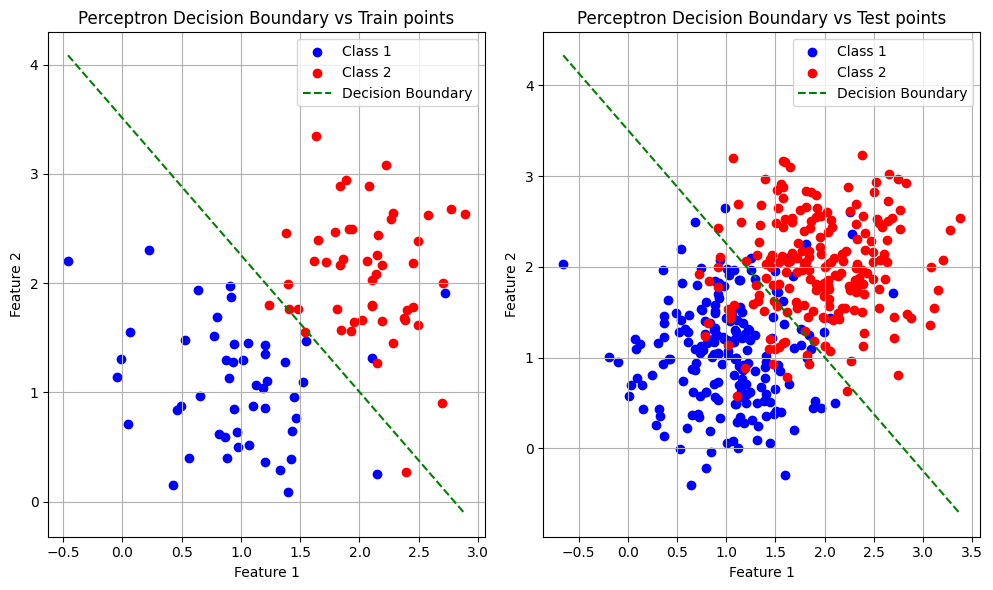

Accuracy with Least Squares Method: 88.0


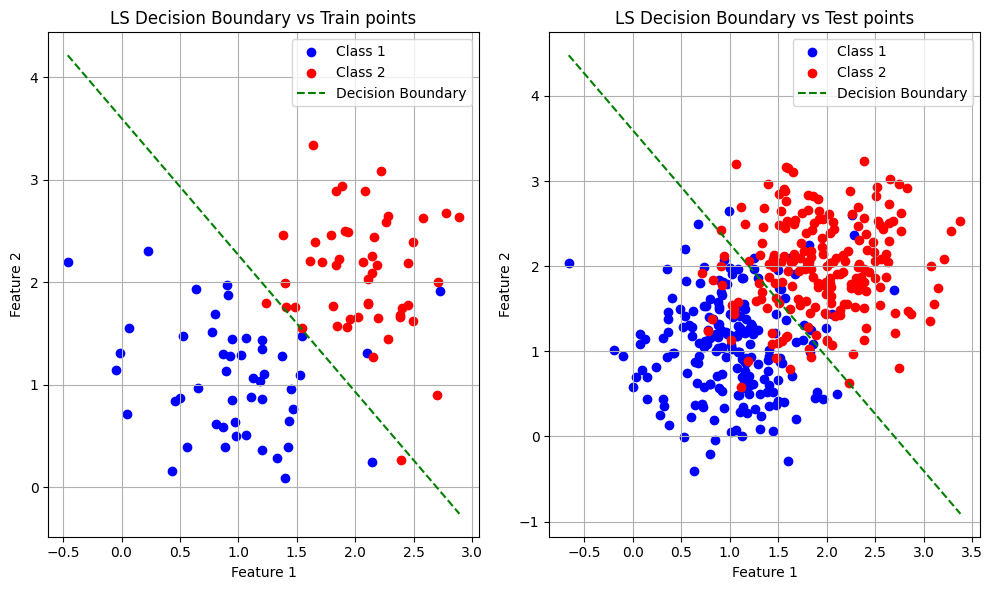

(array([-1.,  1.]), array([50, 50]))
(array([-1.,  1.]), array([200, 200]))
Accuracy with Perceptron: 88.20638820638821


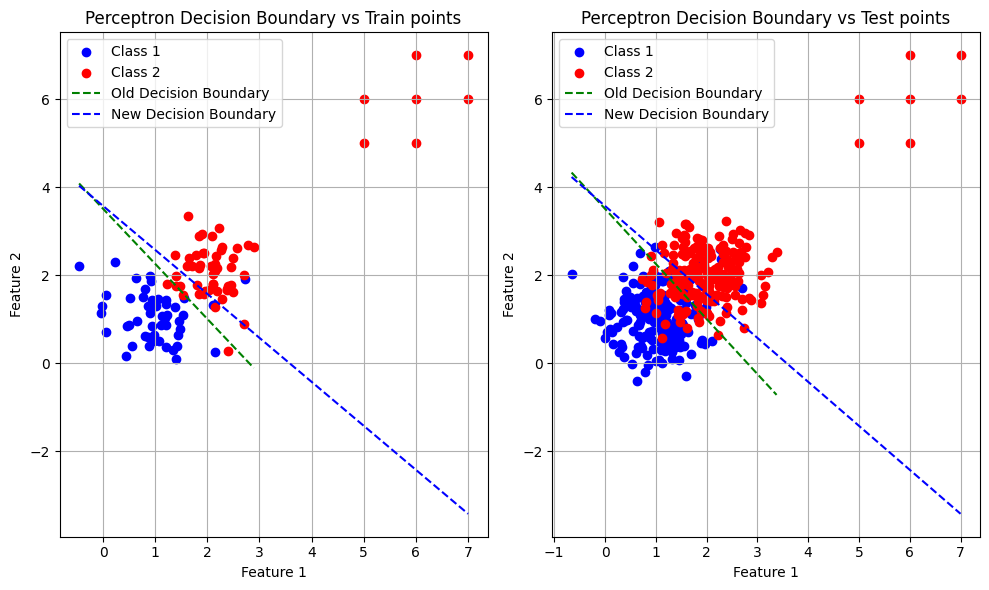

Accuracy with Least Squares Method: 85.25798525798525


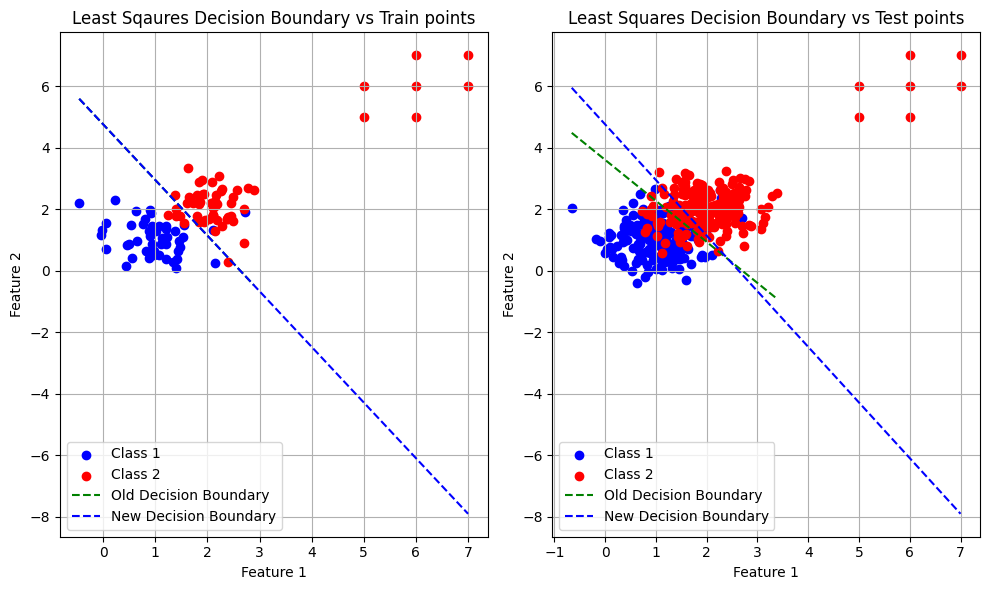

(240, 2)
(240,)
(array([-1.,  1.]), array([68, 76]))
(array([-1.,  1.]), array([52, 44]))
Accuracy with Perceptron: 45.83333333333333


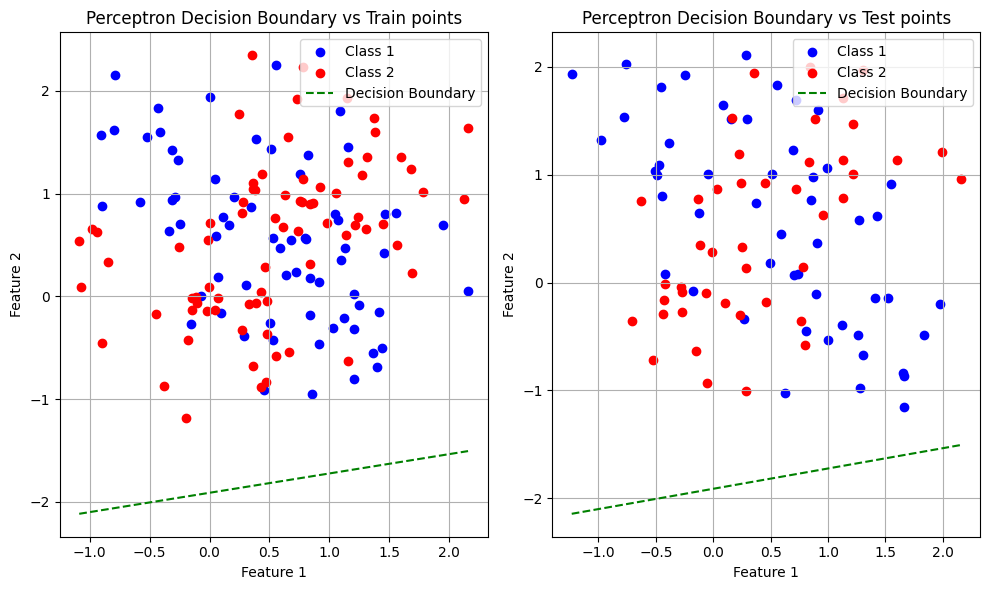

In [33]:
########################################
#Part-3)-(a): Data generation
########################################

# Set the parameters of class distribution
mean1 = [1, 1]           # Mean of class1
mean2 = [2, 2]           # Mean of class2
cov = [[0.3, 0], [0, 0.3]]  # Covariance matrix. Same covariance for class1 and class2

# Generate training data
class1_tr = np.random.multivariate_normal(mean1, cov, 50)  # Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)  # Class2 training data
tr_data = np.vstack((class1_tr, class2_tr))               # Combine class1 training and class2 training data to get total training data
tr_targets = np.hstack((-np.ones(50), np.ones(50)))       # Class labels. Assign the value "0" to class1 and the value "1" to class2.

# Generate testing data
class1_te = np.random.multivariate_normal(mean1, cov, 200)  # Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200)  # Class2 testing data
te_data = np.vstack((class1_te, class2_te))                 # Combine class1 testing and class2 testing data to get total testing data
te_targets = np.hstack((-np.ones(200), np.ones(200)))       # Class labels. Assign the value "0" to class1 and the value "1" to class2.

########################################
#Part-3)-(b)
########################################
def Perceptron(X_train, Y_train, X_test):
    #Inputs: Training data, Training labels, Testing data
    #Outputs: Testing data predictions, Weight vector representing the decision boundary
    epochs = 100000    # Number of epochs
    X= np.hstack((X_train, np.ones((X_train.shape[0], 1))))  # Append ones to the training data to take care of the bias
    w = np.zeros(X.shape[1])  # Initialize the weight vector
    for epoch in range(0,epochs,1):
        # Compute the predictions
        predictions = np.sign(np.dot(X, w))
        # Compute the error
        errors = Y_train - predictions
        # Update the weight vector
        w += np.dot(X.T, errors)
    # Compute the test data predictions using the final weight vector
    X_test_bias = np.hstack((X_test, np.ones((X_test.shape[0], 1))))  # Append ones to the testing data to take care of the bias
    test_predictions = np.sign(np.dot(X_test_bias, w))
    # Return the test data predictions and the final weight vector
    return test_predictions, w

predictions_perceptron, Wi = Perceptron(tr_data, tr_targets, te_data)

##########################################
#Plot the decision boundary using perceptron
##########################################
def plot_decision_boundary_p(X_train,Y_train,X_test, Y_test, weight_vector):
        plt.figure(figsize=(10,6))
        plt.subplot(1,2,2)
        plt.scatter(X_test[Y_test == -1][:, 0], X_test[Y_test == -1][:, 1], color='blue', label='Class 1')
        plt.scatter(X_test[Y_test == 1][:, 0], X_test[Y_test == 1][:, 1], color='red', label='Class 2')
        slope = -weight_vector[0] / weight_vector[1]  # -w2 / w1
        intercept = -weight_vector[2] / weight_vector[1]  # -w0 / w1
        # Calculate x values from the minimum to maximum of the first feature in the test data
        x_values1 = np.linspace(np.min(X_test[:, 0]), np.max(X_test[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values1 = slope * x_values1 + intercept
        plt.plot(x_values1, y_values1, color='green', linestyle='--', label='Decision Boundary')
        plt.title('Perceptron Decision Boundary vs Test points')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.legend()
        plt.grid(True)
        plt.subplot(1,2,1)
        plt.scatter(X_train[Y_train == -1][:, 0], X_train[Y_train == -1][:, 1], color='blue', label='Class 1')
        plt.scatter(X_train[Y_train == 1][:, 0], X_train[Y_train == 1][:, 1], color='red', label='Class 2')
        x_values2 = np.linspace(np.min(X_train[:, 0]), np.max(X_train[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values2 = slope * x_values2 + intercept
        plt.plot(x_values2, y_values2, color='green', linestyle='--', label='Decision Boundary')
        plt.title('Perceptron Decision Boundary vs Train points')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()
acc = np.mean(predictions_perceptron == te_targets)
print('Accuracy with Perceptron:', acc*100)
plot_decision_boundary_p(tr_data, tr_targets,te_data, te_targets, Wi)
##########################################
#Plot the decision boundary using least squares
##########################################
def plot_decision_boundary_l(X_train,Y_train,X_test, Y_test, weight_vector):
        plt.figure(figsize=(10,6))
        plt.subplot(1,2,2)
        plt.scatter(X_test[Y_test == -1][:, 0], X_test[Y_test == -1][:, 1], color='blue', label='Class 1')
        plt.scatter(X_test[Y_test == 1][:, 0], X_test[Y_test == 1][:, 1], color='red', label='Class 2')
        slope = -weight_vector[1] / weight_vector[2]  # -w1 / w2
        intercept = -weight_vector[0] / weight_vector[2]  # -w0 / w2
        # Calculate x values from the minimum to maximum of the first feature in the test data
        x_values1 = np.linspace(np.min(X_test[:, 0]), np.max(X_test[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values1 = slope * x_values1 + intercept
        plt.plot(x_values1, y_values1, color='green', linestyle='--', label='Decision Boundary')
        plt.title('LS Decision Boundary vs Test points')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.legend()
        plt.grid(True)
        plt.subplot(1,2,1)
        plt.scatter(X_train[Y_train == -1][:, 0], X_train[Y_train == -1][:, 1], color='blue', label='Class 1')
        plt.scatter(X_train[Y_train == 1][:, 0], X_train[Y_train == 1][:, 1], color='red', label='Class 2')
        x_values2 = np.linspace(np.min(X_train[:, 0]), np.max(X_train[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values2 = slope * x_values2 + intercept
        plt.plot(x_values2, y_values2, color='green', linestyle='--', label='Decision Boundary')
        plt.title('LS Decision Boundary vs Train points')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()
predictions1,w_ls = LS_Classify(tr_data, tr_targets, te_data,1)
acc1 = np.mean(predictions1 == te_targets)
print('Accuracy with Least Squares Method:', acc1*100)
plot_decision_boundary_l(tr_data, tr_targets,te_data, te_targets,w_ls)
##########################################
#Part-3)-(c): Repeat the experiments with the true outliers added to the data. Compare and contrast the perceptron algorithm with least squares method
##########################################
def plot_decision_boundary_po(X_train,X_test,X_train_new,Y_train_new,X_test_new,Y_test_new,weight_vector1,weight_vector2):
        plt.figure(figsize=(10,6))
        plt.subplot(1,2,2)
        plt.scatter(X_test_new[Y_test_new == -1][:, 0], X_test_new[Y_test_new == -1][:, 1], color='blue', label='Class 1')
        plt.scatter(X_test_new[Y_test_new == 1][:, 0], X_test_new[Y_test_new == 1][:, 1], color='red', label='Class 2')

        slope = -weight_vector1[0] / weight_vector1[1]  # -w2 / w1
        intercept = -weight_vector1[2] / weight_vector1[1]  # -w0 / w1
        # Calculate x values from the minimum to maximum of the first feature in the test data
        x_values1 = np.linspace(np.min(X_test[:, 0]), np.max(X_test[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values1 = slope * x_values1 + intercept
        plt.plot(x_values1, y_values1, color='green', linestyle='--', label='Old Decision Boundary')

        slopen = -weight_vector2[1] / weight_vector2[1]  # -w2 / w1
        interceptn = -weight_vector2[2] / weight_vector2[1]  # -w0 / w1
        # Calculate x values from the minimum to maximum of the first feature in the test data
        x_values1n = np.linspace(np.min(X_test_new[:, 0]), np.max(X_test_new[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values1n = slopen * x_values1n + interceptn
        plt.plot(x_values1n, y_values1n, color='blue', linestyle='--', label='New Decision Boundary')

        plt.title('Perceptron Decision Boundary vs Test points')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.legend()
        plt.grid(True)
        plt.subplot(1,2,1)
        plt.scatter(X_train_new[Y_train_new == -1][:, 0], X_train_new[Y_train_new == -1][:, 1], color='blue', label='Class 1')
        plt.scatter(X_train_new[Y_train_new == 1][:, 0], X_train_new[Y_train_new == 1][:, 1], color='red', label='Class 2')

        x_values2 = np.linspace(np.min(X_train[:, 0]), np.max(X_train[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values2 = slope * x_values2 + intercept
        plt.plot(x_values2, y_values2, color='green', linestyle='--', label='Old Decision Boundary')

        x_values2n = np.linspace(np.min(X_train_new[:, 0]), np.max(X_train_new[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values2n = slopen * x_values2n + interceptn
        plt.plot(x_values2n, y_values2n, color='blue', linestyle='--', label='New Decision Boundary')

        plt.title('Perceptron Decision Boundary vs Train points')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

def plot_decision_boundary_lo(X_train,X_test,X_train_new,Y_train_new,X_test_new,Y_test_new,weight_vector1,weight_vector2):
        plt.figure(figsize=(10,6))
        plt.subplot(1,2,2)
        plt.scatter(X_test_new[Y_test_new == -1][:, 0], X_test_new[Y_test_new == -1][:, 1], color='blue', label='Class 1')
        plt.scatter(X_test_new[Y_test_new == 1][:, 0], X_test_new[Y_test_new == 1][:, 1], color='red', label='Class 2')
        slope = -weight_vector1[1] / weight_vector1[2]  # -w1 / w2
        intercept = -weight_vector1[0] / weight_vector1[2]  # -w0 / w2
        # Calculate x values from the minimum to maximum of the first feature in the test data
        x_values1 = np.linspace(np.min(X_test[:, 0]), np.max(X_test[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values1 = slope * x_values1 + intercept
        plt.plot(x_values1, y_values1, color='green', linestyle='--', label='Old Decision Boundary')

        slopen = -weight_vector2[1] / weight_vector2[2]  # -w1 / w2
        interceptn = -weight_vector2[0] / weight_vector2[2]  # -w0 / w2
        # Calculate x values from the minimum to maximum of the first feature in the test data

        x_values1n = np.linspace(np.min(X_test_new[:, 0]), np.max(X_test_new[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values1n = slopen * x_values1n + interceptn
        plt.plot(x_values1n, y_values1n, color='blue', linestyle='--', label='New Decision Boundary')
        plt.title('Least Squares Decision Boundary vs Test points')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.legend()
        plt.grid(True)
        plt.subplot(1,2,1)
        plt.scatter(X_train_new[Y_train_new == -1][:, 0], X_train_new[Y_train_new == -1][:, 1], color='blue', label='Class 1')
        plt.scatter(X_train_new[Y_train_new == 1][:, 0], X_train_new[Y_train_new == 1][:, 1], color='red', label='Class 2')
        x_values2 = np.linspace(np.min(X_train[:, 0]), np.max(X_train[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values2 = slopen * x_values2 + interceptn
        plt.plot(x_values2, y_values2, color='green', linestyle='--', label='Old Decision Boundary')

        x_values2n = np.linspace(np.min(X_train_new[:, 0]), np.max(X_train_new[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values2n = slopen * x_values2n + interceptn
        plt.plot(x_values2n, y_values2n, color='blue', linestyle='--', label='New Decision Boundary')
        plt.title('Least Sqaures Decision Boundary vs Train points')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()
outliers = np.array([[5, 5],[5,6],[6,5],[6, 6],[7,6],[6,7],[7, 7]])
class2_tr = np.vstack((class2_tr, outliers))
tr_data_new = np.vstack((class1_tr, class2_tr))               # Combine class1 training and class2 training data to get total training data
tr_targets_new = np.hstack((-np.ones(50), np.ones(57)))       # Class labels. Assign the value "-1" to class1 and the value "1" to class2.
class2_te = np.vstack((class2_te, outliers))
te_data_new = np.vstack((class1_te, class2_te))               # Combine class1 training and class2 training data to get total training data
te_targets_new = np.hstack((-np.ones(200), np.ones(207)))       # Class labels. Assign the value "-1" to class1 and the value "1" to class2.
print(np.unique(tr_targets, return_counts=True))
print(np.unique(te_targets, return_counts=True))
#Perceptron
predictions_perceptron_out, Wio = Perceptron(tr_data_new, tr_targets_new, te_data_new)
acc = np.mean(predictions_perceptron_out == te_targets_new)
print('Accuracy with Perceptron:', acc*100)
plot_decision_boundary_po(tr_data,te_data,tr_data_new,tr_targets_new,te_data_new,te_targets_new,Wi,Wio)
#Least Sqaures 
predictions1_out,w_lso = LS_Classify(tr_data_new, tr_targets_new, te_data_new,1)
acc1 = np.mean(predictions1_out == te_targets_new)
print('Accuracy with Least Squares Method:', acc1*100)
plot_decision_boundary_lo(tr_data,te_data,tr_data_new,tr_targets_new, te_data_new,te_targets_new,w_ls,w_lso)
##########################################
#Part-3)-(d): Data generation XOR
##########################################

#Set the parameters of Gaussian distribution
# Set the parameters of Gaussian distribution
class1_mean1 = [0, 0]
class1_mean2 = [1, 1]
class2_mean1 = [0, 1]
class2_mean2 = [1, 0]
cov = [[0.3, 0], [0, 0.3]]

# Generate data points from Gaussian distributions
class1_data1 = np.random.multivariate_normal(class1_mean1, cov, 60)
class1_data2 = np.random.multivariate_normal(class1_mean2, cov, 60)
class2_data1 = np.random.multivariate_normal(class2_mean1, cov, 60)
class2_data2 = np.random.multivariate_normal(class2_mean2, cov, 60)

# Combine data points to create the XOR-like dataset
X_class1 = np.vstack((class1_data1, class1_data2))
X_class2 = np.vstack((class2_data1, class2_data2))
y_class1 = np.ones(X_class1.shape[0])
y_class2 = -np.ones(X_class2.shape[0])
X = np.vstack((X_class1, X_class2))
y = np.hstack((y_class1, y_class2))

# Shuffle the dataset
shuffle_indices = np.arange(X.shape[0])
np.random.shuffle(shuffle_indices)
X_shuffled = X[shuffle_indices]
y_shuffled = y[shuffle_indices]
print(X_shuffled.shape)
print(y_shuffled.shape)
split_index = int(0.6 * X.shape[0])
X_train, X_test = X_shuffled[:split_index], X_shuffled[split_index:]
y_train, y_test = y_shuffled[:split_index], y_shuffled[split_index:]
print(np.unique(y_train, return_counts=True))
print(np.unique(y_test, return_counts=True))
#Classify this dataset using perceptron algorithm
predictions_perceptron_xor, Win = Perceptron(X_train,y_train,X_test)
accx = np.mean(predictions_perceptron_xor == y_test)
print('Accuracy with Perceptron:', accx*100)
#Plot the decision boundary
plot_decision_boundary_p(X_train,y_train,X_test,y_test,Win)


<b> Report your observations </b>

1. Limitations of least squares was minimized by the perceptron.

2. When outliers were added,the perceptron performing well than least squares.

3. Perceptron couldn't able to classify the XOR dataset as XOR is not-linearly seperable dataset but percpetron works only for linearly seperable dataset.



<b> Part (4) : Understanding the decision boundaries of MAP approach to classification - </b> Decision boundary in 2 class classification problem is the locus of points satisfying $p(c_{1}/x)$ = $p(c_{2}/x)$. Where $c_{1}$ and $c_{2}$ are the class indicators and $x$ is the data. With proper assumpuptions on prior and likelihood, p(c/x) follows Gaussian distribution with appropriate parameters. Given the parameters of the Guassian distribution for the two classes i.e $\mu_{1},\Sigma_{1},\mu_{2},\Sigma_{2}$, we can derive the decision boundary equation i.e W and $w_{0}$. You may refer to class notes for the derivations and final equations. In this part of programming assignment we expect you to code the decision boundaries for the Gaussian distribution case and understand them.

**a). Class distributions share the same covariance matrix: Linear decision boundary.**
  0. Let $\mu_{1} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\mu_{2} = \begin{bmatrix} 4  \\ 1 \end{bmatrix}$, and $\Sigma_{1}= \Sigma_{2} = \Sigma =  \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}$
  1. Generate 100 samples from each class. This data set is used to understand the decision boundaries when $p(c_{1}) = p(c_{2})$
  2. Generate 50 samples from class1 and 150 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) < p(c_{2})$
  3. Generate 150 samples from class1 and 50 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) > p(c_{2})$
  4. Plot the decision boundaries for all the three cases in three different subplots.


**b). Class distributions have different covariance matrices: Non-linear decision boundary.**
  0. Let $\mu_{1} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\mu_{2} = \begin{bmatrix} 3  \\ 1 \end{bmatrix}$, $\Sigma_{1}=   \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.02 \end{bmatrix}$, and $\Sigma_{2}=   \begin{bmatrix} 0.02 & 0.0  \\ 0.0 & 0.2 \end{bmatrix}$
  1. Generate 100 samples from each class. This data set is used to understand the decision boundaries when $p(c_{1}) = p(c_{2})$
  2. Generate 50 samples from class1 and 150 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) < p(c_{2})$
  3. Generate 150 samples from class1 and 50 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) > p(c_{2})$
  4. Plot the decision boundaries for all the three cases in three different subplots.


**c). Report your observations**




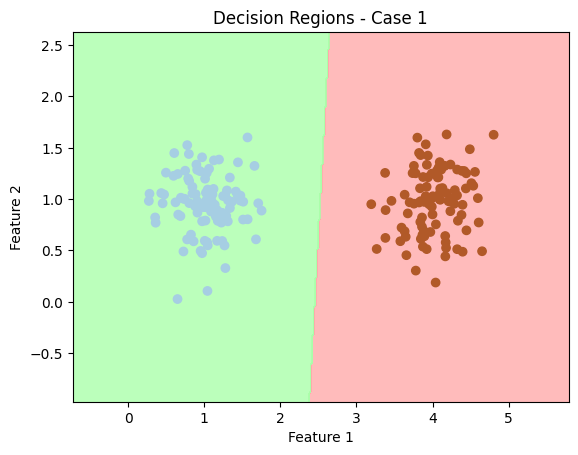

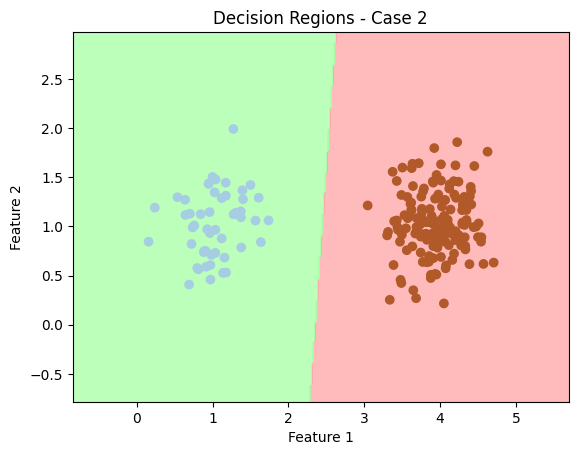

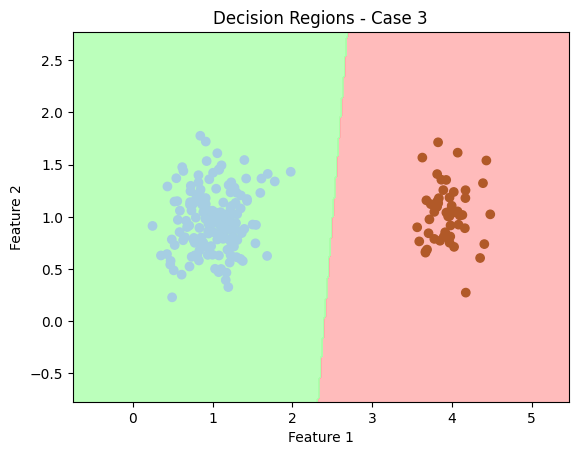

In [6]:
##########################################
#Part-4a)-0: Data Generation
##########################################
m1 =[1,1]
m2 =[4,1]
cov =[[0.1,0.0],[0.0,0.1]]

#Case1: Generate 100 samples from each class. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class_1_100=np.random.multivariate_normal(m1,cov,100)
class_2_100=np.random.multivariate_normal(m2,cov,100)
tr_data_1=np.vstack((class_1_100,class_2_100))
tr_targets_1=np.hstack((-np.ones(100),np.ones(100)))

#Case2: Generate 50 samples from class1 and 150 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class_1_50=np.random.multivariate_normal(m1,cov,50)
class_2_150=np.random.multivariate_normal(m2,cov,150)
tr_data_2=np.vstack((class_1_50,class_2_150))
tr_targets_2=np.hstack((-np.ones(50),np.ones(150)))

#Case3: Generate 150 samples from class1 and 50 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class_1_150=np.random.multivariate_normal(m1,cov,150)
class_2_50=np.random.multivariate_normal(m2,cov,50)
tr_data_3=np.vstack((class_1_150,class_2_50))
tr_targets_3=np.hstack((-np.ones(150),np.ones(50)))

##########################################
#Part-4a)-4: Plot the decision regions for all the three cases
##########################################
#Complete the below function
def decisionBoundary(X_train, Y_train):
    #Inputs: Training data and Training labels
    #Outputs: Decision boundary parameters, i.e., w0, w
    p_c1 = np.mean(Y_train == -1)
    p_c2 = 1. - p_c1
    mean_1 = np.mean(X_train[np.where(Y_train == -1)[0]],axis = 0)
    mean_2 = np.mean(X_train[np.where(Y_train == 1)[0]],axis = 0)
    cov1 = np.cov(X_train[Y_train == -1], rowvar=False)
    cov2 = np.cov(X_train[Y_train == 1], rowvar=False)
    cov = p_c1 * cov1 + p_c2 * cov2
    w = np.linalg.inv(cov) @ (mean_1 - mean_2)
    w0 = 0.5 * (mean_2 @ np.linalg.inv(cov) @ mean_2 - mean_1 @ np.linalg.inv(cov) @ mean_1) + np.log(p_c1 / p_c2)
    return np.array([w0] + list(w))

#Plot the decision regions
def plot_decision_regions(X_train, Y_train, title):
    # Create a meshgrid to evaluate model
    h = .02  # Step size in mesh
    x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
    y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    w0, w1, w2 = decisionBoundary(X_train, Y_train)
    Z = np.sign(w0 + np.dot(np.c_[xx.ravel(), yy.ravel()], [w1, w2])).reshape(xx.shape)
    plt.figure()
    cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA'])
    plt.contourf(xx, yy, Z, cmap=cmap_light, alpha=0.8)
    plt.scatter(X_train[:, 0], X_train[:, 1], c=Y_train, cmap=plt.cm.Paired)
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

# Plot decision regions for all three cases
plot_decision_regions(tr_data_1, tr_targets_1, "Decision Regions - Case 1")
plot_decision_regions(tr_data_2, tr_targets_2, "Decision Regions - Case 2")
plot_decision_regions(tr_data_3, tr_targets_3, "Decision Regions - Case 3")



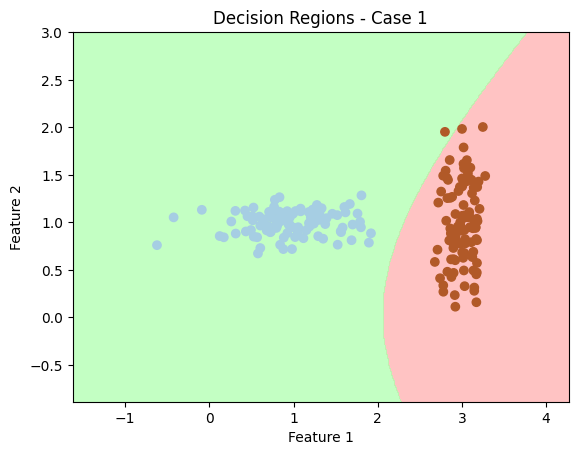

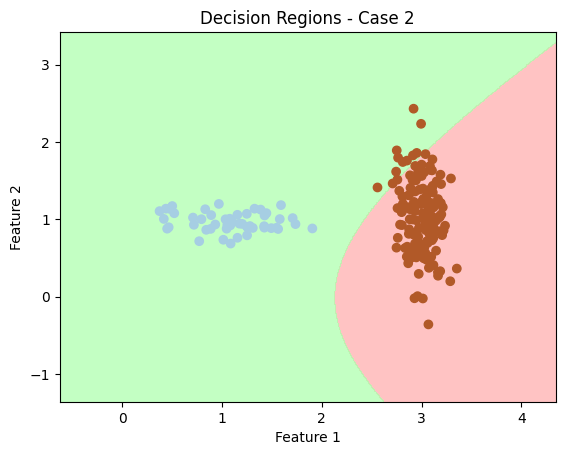

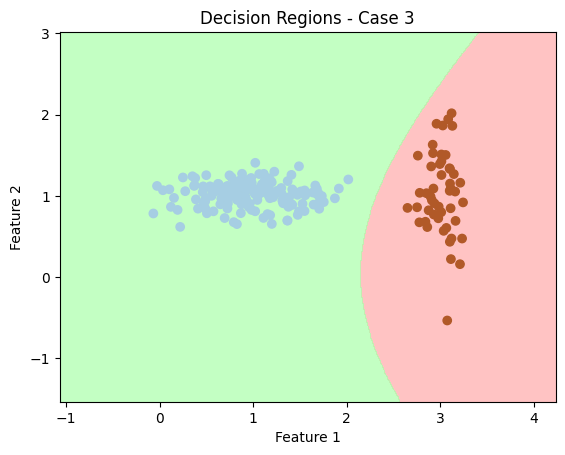

In [7]:
##########################################
#Part-4b)-0: Data Generation
##########################################
m1 =[1,1]
m2 =[3,1]
cov1 =[[0.2,0.0],[0.0,0.02]]
cov2 =[[0.02,0.0],[0.0,0.2]]

#Case1: Generate 100 samples from each class. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class_1_100=np.random.multivariate_normal(m1,cov1,100)
class_2_100=np.random.multivariate_normal(m2,cov2,100)
tr_data_1=np.vstack((class_1_100,class_2_100))
tr_targets_1=np.hstack((-np.ones(100),np.ones(100)))

#Case2: Generate 50 samples from class1 and 150 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class_1_50=np.random.multivariate_normal(m1,cov1,50)
class_2_150=np.random.multivariate_normal(m2,cov2,150)
tr_data_2=np.vstack((class_1_50,class_2_150))
tr_targets_2=np.hstack((-np.ones(50),np.ones(150)))

#Case3: Generate 150 samples from class1 and 50 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class_1_150=np.random.multivariate_normal(m1,cov1,150)
class_2_50=np.random.multivariate_normal(m2,cov2,50)
tr_data_3=np.vstack((class_1_150,class_2_50))
tr_targets_3=np.hstack((-np.ones(150),np.ones(50)))

##########################################
#Part-4b)-4: Plot the decision regions for all the three cases
##########################################
#Complete the below function
def decisionBoundary(X_train, Y_train):
    # Inputs: Training data and Training labels
    # Outputs: Decision boundary parameters, i.e., w0, w
    N1 = np.count_nonzero(Y_train == -1)
    N2 = np.count_nonzero(Y_train == 1)
    N = N1 + N2
    p_c1 = N1/N
    p_c2 = 1. - p_c1
    mean_1 = np.mean(X_train[np.where(Y_train == -1)[0]], axis=0)
    mean_2 = np.mean(X_train[np.where(Y_train == 1)[0]], axis=0)
    cov1 = np.cov(X_train[Y_train == -1], rowvar=False)
    cov2 = np.cov(X_train[Y_train == 1], rowvar=False)
    W = 0.5*(np.linalg.inv(cov1) - np.linalg.inv(cov2))
    W = (W + W.T)
    w0 = 0.5 * (mean_2 @ np.linalg.inv(cov2) @ mean_2 - mean_1 @ np.linalg.inv(cov1) @ mean_1) + np.log(p_c1 / p_c2)
    return w0, W

# Plot the decision regions
def plot_decision_regions(X_train, Y_train, title):
    h = 0.01  # Step size in mesh
    x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
    y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    w0, W = decisionBoundary(X_train, Y_train)
    Z = np.sign(w0 + np.sum(np.dot(np.c_[xx.ravel(), yy.ravel()], W) * np.c_[xx.ravel(), yy.ravel()], axis=1)).reshape(xx.shape)
    plt.figure()
    cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA'])
    plt.contourf(xx, yy, Z, cmap=cmap_light, alpha=0.7, levels=np.linspace(-1, 1, 3))
    plt.scatter(X_train[:, 0], X_train[:, 1], c=Y_train, cmap=plt.cm.Paired)
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

plot_decision_regions(tr_data_1, tr_targets_1, "Decision Regions - Case 1")
plot_decision_regions(tr_data_2, tr_targets_2, "Decision Regions - Case 2")
plot_decision_regions(tr_data_3, tr_targets_3, "Decision Regions - Case 3")


<b> Report your observations </b>

1. When the classes are created from same covariance then the classification is at middle and even if the change in samples the classification doesn't change siginficantly and almost same.

2. In 4a, the decision boundary is linear where as in 4b it is not linear.

3. In 4b, The 2 covariances are different which result in the change of decision boundary of data.



<b> Part-5) Classification using logistic regression ( Iterative reweighted least squares approach ): </b> logistic regression model: $y = \frac{1}{1+e^{-\textbf{w}^{T}\textbf{x}}}$. With the provided training data, X_train and Y_train, your task is to identify the optimal $\textbf{w}$ that accurately predicts y based on the input $\textbf{x}$. Subsequently, this $\textbf{w}$ can be applied to predict outcomes on the test data, X_test.





a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Create a function called "Logistic_Regression" that accepts training data, training labels, and testing data as inputs. The function should aim to discover the optimal $\textbf{w}$ using the training data. You can initialize $\textbf{w}$ with random values and iteratively update it to determine the optimal $\textbf{w}$. Subsequently, this optimal $\textbf{w}$ can be employed to make predictions on the test data.

c). Evaluate the classification performance, i.e., compute the accuracy on the test data.

d). Write a function to generate & visualize the decision regions, either by showing the boundary line or by using different colors for the two regions. Overlay the test points using scatter.

e). Introduce genuine outliers to one of the class datasets generated previously. Then, conduct Least Squares classification and Logistic Regression on this modified dataset. Plot the decision boundaries/regions and provide insights into the differences between their outcomes.


f). Report your observations




 Accuracy with Logistic Regression: 0.88 




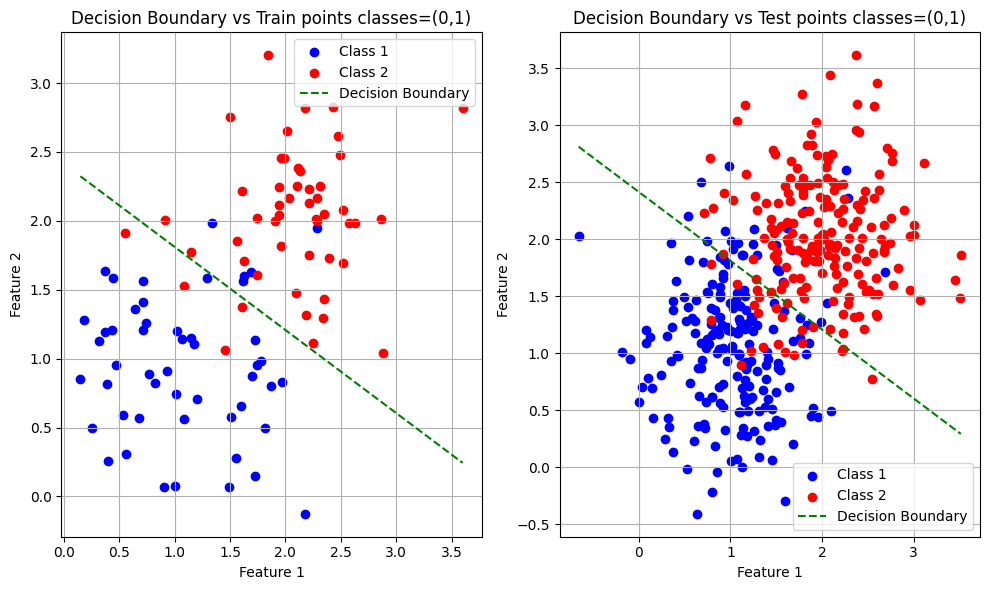

(array([0., 1.]), array([50, 57]))
(array([0., 1.]), array([200, 207]))
Accuracy with Logistic Regression: 88.20638820638821


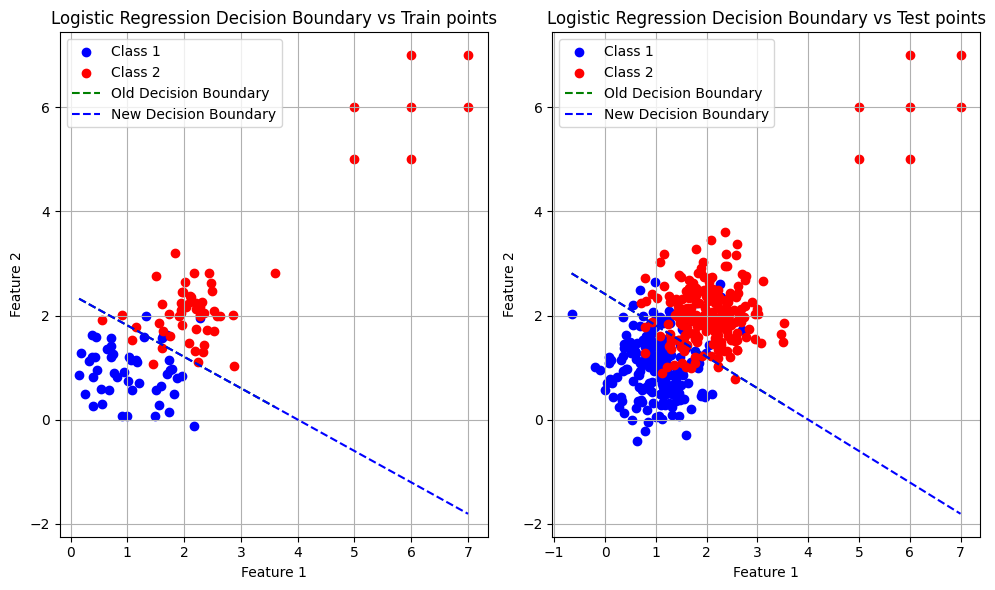

Accuracy with Least Squares Method: 50.859950859950864


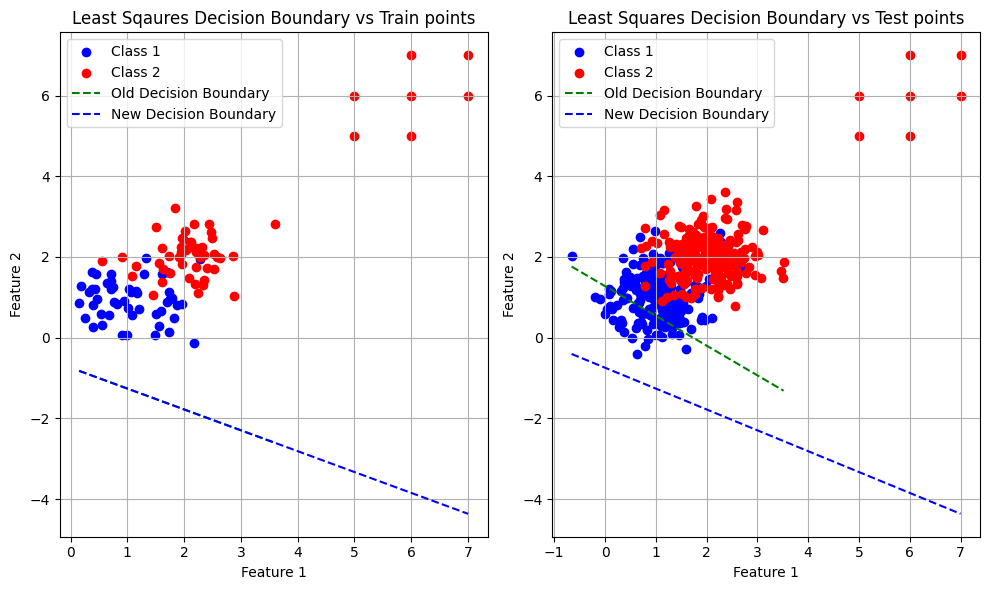

In [49]:
##################################################
#Part-5)-1: Data generation
##################################################
#Set the parameters of class distribution
mean1 =  [1,1]         #Mean of class1
mean2 =  [2,2]          #Mean of class2
cov = [[0.3,0.0],[0.0,0.3]] #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1,cov,50)            #Class1 training data
class2_tr = np.random.multivariate_normal(mean2,cov,50)            #Class2 training data
tr_data =  np.concatenate([class1_tr,class2_tr],axis = 0)            #Combine class1 training and class2 training data to get total training data
tr_targets =  np.concatenate([np.repeat(0,class1_tr.shape[0]),np.repeat(1,class2_tr.shape[0])])       #Class labels. Assign the value "0" to class1 and the value "1" to class2.

#Generate testing data.
class2_te =  np.random.multivariate_normal(mean1,cov,200)           #Class1 testing data
class2_te =  np.random.multivariate_normal(mean2,cov,200)            #Class2 testing data
te_data =    np.concatenate([class1_te,class2_te],axis = 0)           #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.concatenate([np.repeat(0,class1_te.shape[0]),np.repeat(1,class2_te.shape[0])])         #Class labels. Assign the value "0" to class1 and the value "1" to class2.

################################################
#Part-5)-b: Complete the below logistic regression function
##################################################
def Logistic_Regression(X_train, Y_train, X_test):
    # Add bias term to training and testing data
    X_train = np.hstack((np.ones((X_train.shape[0], 1)), X_train))
    X_test = np.hstack((np.ones((X_test.shape[0], 1)), X_test))
    max_iter = 500  # Maximum number of iterations for parameter update
    threshold = 0.5  # Threshold for classification
    # Initialize weights
    w = np.array([0.1,0.5,0.1])
    for _ in range(max_iter):
        # Compute predictions using sigmoid function
        preds = 1 / (1 + np.exp(-X_train @ w))
        
        # Compute gradients
        error = preds - Y_train
        gradient = X_train.T @ error
        
        # Compute Hessian matrix
        R = np.diag(preds * (1 - preds))
        
        # Update weights using Newton-Raphson method
        w -= np.linalg.inv(X_train.T @ R @ X_train) @ X_train.T @ error

    # Predict on test data
    test_prediction = 1 / (1 + np.exp(-X_test @ w))

    # Apply threshold for classification
    test_preds = (test_prediction > threshold).astype(int)

    return test_preds, w

Y_pred,w = Logistic_Regression(tr_data, tr_targets, te_data)

###############################################
#Part-5)-c:
###############################################
def LR_Accuracy(Y_test, Y_pred):
  #Inputs: Ground truth and predicted lables of test data
  #Outputs: Accuracy
  acc = np.sum(Y_test == Y_pred)/(Y_pred.shape[0])
  #Compute and return the accuracy
  return acc%100
acc = LR_Accuracy(te_targets, Y_pred)
print('\n\n Accuracy with Logistic Regression:', acc, '\n\n')

##########################################
#Part-5)-d: Plot the decision regions. Overlay the test points on the plot
##########################################
def plot_decision_regions(X, y, w, title="Decision Regions"):
    # Determine the x and y limits of the plot
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1

    # Generate a grid of points within the limits
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                         np.arange(y_min, y_max, 0.1))

    # Predict the class labels for the corresponding grid points
    Z = np.sign(np.dot(np.c_[xx.ravel(), yy.ravel()], w))
    Z = Z.reshape(xx.shape)
    
    # Plot decision regions
    plt.contourf(xx, yy, Z, alpha=0.7)
    
    # Plot data points
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Paired, edgecolors='k')
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()
plot_decision_boundary(tr_data, tr_targets,te_data, te_targets,w,0)
# plot_decision_regions(tr_data, tr_targets, w)
##########################################
#Part-5)-e: Logistic regression for the data with true outliers
##########################################
def plot_decision_boundary_ls(X_train,X_test,X_train_new,Y_train_new,X_test_new,Y_test_new,weight_vector1,weight_vector2):
        plt.figure(figsize=(10,6))
        plt.subplot(1,2,2)
        plt.scatter(X_test_new[Y_test_new == 0][:, 0], X_test_new[Y_test_new == 0][:, 1], color='blue', label='Class 1')
        plt.scatter(X_test_new[Y_test_new == 1][:, 0], X_test_new[Y_test_new == 1][:, 1], color='red', label='Class 2')
        slope = -weight_vector1[1] / weight_vector1[2]  # -w1 / w2
        intercept = -weight_vector1[0] / weight_vector1[2]  # -w0 / w2
        # Calculate x values from the minimum to maximum of the first feature in the test data
        x_values1 = np.linspace(np.min(X_test[:, 0]), np.max(X_test[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values1 = slope * x_values1 + intercept
        plt.plot(x_values1, y_values1, color='green', linestyle='--', label='Old Decision Boundary')

        slopen = -weight_vector2[1] / weight_vector2[2]  # -w1 / w2
        interceptn = -weight_vector2[0] / weight_vector2[2]  # -w0 / w2
        # Calculate x values from the minimum to maximum of the first feature in the test data
        x_values1n = np.linspace(np.min(X_test_new[:, 0]), np.max(X_test_new[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values1n = slopen * x_values1n + interceptn
        plt.plot(x_values1n, y_values1n, color='blue', linestyle='--', label='New Decision Boundary')
        plt.title('Logistic Regression Decision Boundary vs Test points')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.legend()
        plt.grid(True)
        plt.subplot(1,2,1)
        plt.scatter(X_train_new[Y_train_new == 0][:, 0], X_train_new[Y_train_new == 0][:, 1], color='blue', label='Class 1')
        plt.scatter(X_train_new[Y_train_new == 1][:, 0], X_train_new[Y_train_new == 1][:, 1], color='red', label='Class 2')
        x_values2 = np.linspace(np.min(X_train[:, 0]), np.max(X_train[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values2 = slopen * x_values2 + interceptn
        plt.plot(x_values2, y_values2, color='green', linestyle='--', label='Old Decision Boundary')
        x_values2n = np.linspace(np.min(X_train_new[:, 0]), np.max(X_train_new[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values2n = slopen * x_values2n + interceptn
        plt.plot(x_values2n, y_values2n, color='blue', linestyle='--', label='New Decision Boundary')
        plt.title('Logistic Regression Decision Boundary vs Train points')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()
def plot_decision_boundary_lo(X_train,X_test,X_train_new,Y_train_new,X_test_new,Y_test_new,weight_vector1,weight_vector2):
        plt.figure(figsize=(10,6))
        plt.subplot(1,2,2)
        plt.scatter(X_test_new[Y_test_new == 0][:, 0], X_test_new[Y_test_new == 0][:, 1], color='blue', label='Class 1')
        plt.scatter(X_test_new[Y_test_new == 1][:, 0], X_test_new[Y_test_new == 1][:, 1], color='red', label='Class 2')
        slope = -weight_vector1[1] / weight_vector1[2]  # -w1 / w2
        intercept = -weight_vector1[0] / weight_vector1[2]  # -w0 / w2
        # Calculate x values from the minimum to maximum of the first feature in the test data
        x_values1 = np.linspace(np.min(X_test[:, 0]), np.max(X_test[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values1 = slope * x_values1 + intercept
        plt.plot(x_values1, y_values1, color='green', linestyle='--', label='Old Decision Boundary')

        slopen = -weight_vector2[1] / weight_vector2[2]  # -w1 / w2
        interceptn = -weight_vector2[0] / weight_vector2[2]  # -w0 / w2
        # Calculate x values from the minimum to maximum of the first feature in the test data

        x_values1n = np.linspace(np.min(X_test_new[:, 0]), np.max(X_test_new[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values1n = slopen * x_values1n + interceptn
        plt.plot(x_values1n, y_values1n, color='blue', linestyle='--', label='New Decision Boundary')
        plt.title('Least Squares Decision Boundary vs Test points')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.legend()
        plt.grid(True)
        plt.subplot(1,2,1)
        plt.scatter(X_train_new[Y_train_new == 0][:, 0], X_train_new[Y_train_new == 0][:, 1], color='blue', label='Class 1')
        plt.scatter(X_train_new[Y_train_new == 1][:, 0], X_train_new[Y_train_new == 1][:, 1], color='red', label='Class 2')
        x_values2 = np.linspace(np.min(X_train[:, 0]), np.max(X_train[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values2 = slopen * x_values2 + interceptn
        plt.plot(x_values2, y_values2, color='green', linestyle='--', label='Old Decision Boundary')

        x_values2n = np.linspace(np.min(X_train_new[:, 0]), np.max(X_train_new[:, 0]), 100)
        # Calculate y values using the equation of the line (y = mx + b)
        y_values2n = slopen * x_values2n + interceptn
        plt.plot(x_values2n, y_values2n, color='blue', linestyle='--', label='New Decision Boundary')
        plt.title('Least Sqaures Decision Boundary vs Train points')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()
outliers = np.array([[5, 5],[5,6],[6,5],[6, 6],[7,6],[6,7],[7, 7]])
class2_tr = np.vstack((class2_tr, outliers))
tr_data_new = np.vstack((class1_tr, class2_tr))               # Combine class1 training and class2 training data to get total training data
tr_targets_new = np.hstack((np.zeros(50), np.ones(57)))       # Class labels. Assign the value "-1" to class1 and the value "1" to class2.
class2_te = np.vstack((class2_te, outliers))
te_data_new = np.vstack((class1_te, class2_te))               # Combine class1 training and class2 training data to get total training data
te_targets_new = np.hstack((np.zeros(200), np.ones(207)))       # Class labels. Assign the value "-1" to class1 and the value "1" to class2.
print(np.unique(tr_targets_new, return_counts=True))
print(np.unique(te_targets_new, return_counts=True))
#Perceptron
Y_pred_new,w_new = Logistic_Regression(tr_data_new, tr_targets_new, te_data_new)
acc = np.mean(Y_pred_new == te_targets_new)
print('Accuracy with Logistic Regression:', acc*100)
plot_decision_boundary_ls(tr_data,te_data,tr_data_new,tr_targets_new,te_data_new,te_targets_new,w,w_new)
#Least Sqaures 
predictions,w_ls = LS_Classify(tr_data, tr_targets, te_data,0)
predictions1_out,w_lso = LS_Classify(tr_data_new, tr_targets_new, te_data_new,0)
acc1 = np.mean(predictions1_out == te_targets_new)
print('Accuracy with Least Squares Method:', acc1*100)
plot_decision_boundary_lo(tr_data,te_data,tr_data_new,tr_targets_new, te_data_new,te_targets_new,w_ls,w_lso)


<b> Report your observations </b>

1. The accuracy of Logistic regression was stable and also decision boundary also done well.

2. When outliers added then logistic regression wasn't changed and also accurcies are also same as here probabilities will be fixed.

3. When outliers added then least squares regression was fallen to 50% where we can conclude that the new data points affects the decision boundary



<b> Part (6) : Estimating the parameters of Gaussian Mixture Models (GMM) using Expectation-Maximization (EM) algorithm </b>


<dt> <b> a. Generating synthetic data : </b>  This part describes the steps involved in generating the synthetic data. </dt>


<dt>  1. Let us consider the GMM with Bivariate Gaussians   </dt>
<dd>  - Choose the appropriate means ($\mu$), covariances ($\Sigma$), and weights ($\pi$) of Bivariate Gaussian distributions. You may choose the following parameters for this asignment.  </dd>
<br>
<dt>  <center> $ \pi = \begin{bmatrix} 0.6  \\ 0.4 \end{bmatrix} \;\;\;\; \mu_{1} = \begin{bmatrix} -1.0  \\ -1.0 \end{bmatrix} \;\;\;\; \mu_{2} = \begin{bmatrix} 1.0  \\ 1.0 \end{bmatrix} \;\;\;\; $ </center>   </dd>
<br>
<dt>  <center> $ \Sigma_{1}^{full} = \begin{bmatrix} 0.15 & 0.1  \\ 0.1 & 0.25 \end{bmatrix} \;\;\;\; \Sigma_{2}^{full} = \begin{bmatrix} 0.3 & -0.25  \\ -0.25 & 0.25 \end{bmatrix}  $ </center>  </dd>
<br>
<dt>  <center> $ \Sigma_{1}^{diagonal} = \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.2 \end{bmatrix} \;\;\;\; \Sigma_{2}^{diagonal} = \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}  $ </center>  </dd>
<br>
<dt>  <center> $ \Sigma_{1}^{spherical} = \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.2 \end{bmatrix} \;\;\;\; \Sigma_{2}^{spherical} = \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}  $ </center>  </dd>

<dd>  - Pick one Gaussian following the selection probability as  $\pi$    </dd>
<dd>  - Sample the data point from the selected Bivariate Gaussian distribution    </dd>
<dd>  - Repeat the process N times to get the entire data set  </dd>
<dt>  2.Create the synthetic data set with the number of mixtures as 2.  </dt>
<dt>  3.Plot the synthetic data set with unique colors to the data points drawn from each Bivariate Gaussian distribution in GMM  </h4> </dt> </dd>

<dt> <b> b. Implementation of Expectation and Maximization (EM) algorithm : </b> This part focuses on implementing the EM algorithm from scratch to estimate the parameters of the Gaussian Mixture Model (GMM). </dt>  

<dt>  1. Chose the number of mixtures (M) and initialize the parameters of GMM model  </dt>
<dd>  - Make sure that the diagonal elements of covariance are positive, and the weights of Gaussians are positive and sum to 1 for satisfying the axioms of probability.  </dd>

<dt>   2. Expectation step :  Evaluate the responsibility of Gaussians in generating the data points using the current estimated parameters i.e $\hat\mu_{k}$ , $\hat\Sigma_{k}$ and $\hat\pi_{k}$, here k indicates the Gaussian in GMM  </dt>
<br>

<dd>  <center> $\gamma_{nk} = \frac{\pi_{k} N ( \textbf{x}_{n} / \mu_{k} , \Sigma_{k} )}{ \sum_{m=1}^{M} \pi_{m} N ( x_{n} / \mu_{m} , \Sigma_{m} ) }    \;\;\;\;\;\; ∀ \;\;k=1,2,...,M \;\; and \;\; n=1,2,...,N$  </center>  </dd>

<br>

<dd>   Where N is the total number of data points and M is the total number of Gaussians in GMM   </dd>

<dd>   - $\gamma_{nk}$ represents the responsibility of $k^{th}$ Gaussian in generating the $n^{th}$ data point   </dd>

<dd>   - $\sum_{n=1}^{N}$ $\gamma_{nk}$ represents the the effective number of data points generated by $k^{th}$ Gaussian   </dd>


<dt>   3. Maximization step :  Update the parameters ($\hat\mu_{k}$ , $\hat\Sigma_{k}$ and $\hat\pi_{k}$) of GMM using the current resosibilities ($\gamma_{nk}$) by maximizing the likelihood. </dt>

<dd>
 - Effective number of data points generated by $k^{th}$ Gaussian : $N_{k}$ = $\sum_{n=1}^{N}$ $\gamma_{nk}$   
 </dd>

<dd>
 - Mean of $k^{th}$ Gaussian : $\hat{\mu_{k}} = \frac{1}{N_{k}} \sum_{n=1}^{N}\gamma_{nk} x_{n}$   
 </dd>

<dd>
 - Covariance of $k^{th}$ Gaussian : $\hat{\Sigma_{k}} = \frac{1}{N_{k}} \sum_{n=1}^{N} \gamma_{nk} ( x_{n} - \hat{\mu_{k}} )( x_{n} - \hat{\mu_{k}} )^{T}$   
 </dd>

<dd>
 - Weight of $k^{th}$ Gaussian : $\hat{\pi_{k}} = \frac{N_{k}}{N}$  
 </dd>

<dt>  4. Compute the log-likelihood with the updated parameters  </dt>
<dt>   5. Repeat the expectation and maximization steps untill convergence  </dt>

<dt>  <b> c. Illustration of EM iterations </b>  </dt>

<dt>   5. Plot the contours of the estimated distributions over the iterations in the EM algorithm and overlay the data points.  </dt>

<dt>  <b> d. Understanding the issues with EM algorithm </b>  </dt>
<dt>   6. Check the influence of initialization on the convergence of the EM algorithm and fit quality.  </dt>
<dd>   - Demonstrate the observations with the plots mentioned in the "Illustration of EM iterations" section    </dd>
<dt>   6. Check the influence of the type of covariance matrix on the convergence of the EM algorithm and fit quality . </dt>
<dd>   - Execute the EM algorithm with different covariance matrices i.e Spherical, Diagonal and Full covariance  </dd>
<dd>   - Demonstrate the observations with the plots mentioned in the "Illustration of EM iterations" section  </dd>


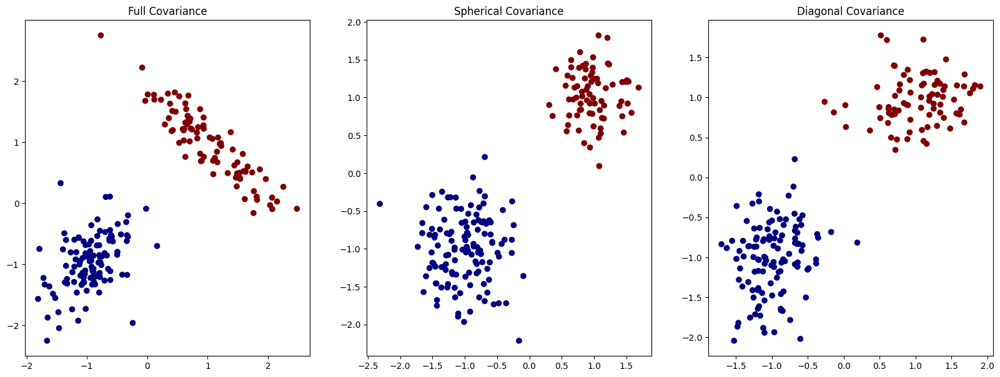

In [141]:
# All imports
import numpy as np
import pandas as pd
import random as rand
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from scipy.stats import norm, multivariate_normal
import sys
import math

##########################################
# Part-6)-a: Generating synthetic data
##########################################

def generateData(pi, mu, sigma, N):
    ############################################################################
    # pi = weights of Gaussians, mu = mean of Gaussians, sigma = convariance of Gaussians, N = number of data points
    # Steps
    # 1. Select the Gaussian following the probability distribution as pi
    # 2. Sample the data points from the selected Gaussian
    # 3. Repeat the process N times to get N data points
    # 4. Return the sampled data
    ############################################################################
    data = []
    labels = []
    for _ in range(N):
        g_index = np.random.choice(len(pi), p=pi)
        sampled_data = np.random.multivariate_normal(mu[g_index], sigma[g_index])
        data.append(sampled_data)
        labels.append(g_index)
    return np.asarray(data), np.asarray(labels)
    ############################################################################

############################################################################
# Chose the appropriate means (μ), covariances (Σ), and weights
############################################################################
mu1 = np.array([-1.0, -1.0])  # Mean vector of component1 in GMM
sig1 = np.array([[0.15, 0.1], [0.1, 0.25]])  # Full covariance matrix of component1 in GMM
mu2 = np.array([1.0, 1.0])  # Mean vector of component2 in GMM
sig2 = np.array([[0.3, -0.25], [-0.25, 0.25]])  # Full covariance matrix of component2 in GMM
pi = np.array([0.6, 0.4])  # Prior probabilities

n_points = 200  # Number of points

# Spherical covariances
sig1_s = np.array([[0.2, 0.], [0., 0.2]])
sig2_s = np.array([[0.1, 0.], [0., 0.1]])

# Diagonal covariances
sig1_d = np.array([[0.1, 0.], [0., 0.2]])
sig2_d = np.array([[0.2, 0.], [0., 0.1]])

############################################################################
# Create the synthetic data set
############################################################################

data_full, labels_full = generateData(pi, [mu1, mu2], [sig1, sig2], n_points)
data_sp, labels_sp = generateData(pi, [mu1, mu2], [sig1_s, sig2_s], n_points)
data_dg, labels_dg = generateData(pi, [mu1, mu2], [sig1_d, sig2_d], n_points)

############################################################################
# Plot the synthetic data set
############################################################################

fig, ax = plt.subplots(1, 3, figsize=(20, 7))

# Visualize the data sampled from the GMM with full covariance matrix
ax[0].scatter(data_full[:, 0], data_full[:, 1], c=labels_full, cmap='jet')
ax[0].set_title('Full Covariance')

# Visualize the data sampled from the GMM with spherical covariance matrix
ax[1].scatter(data_sp[:, 0], data_sp[:, 1], c=labels_sp, cmap='jet')
ax[1].set_title('Spherical Covariance')

# Visualize the data sampled from the GMM with diagonal covariance matrix
ax[2].scatter(data_dg[:, 0], data_dg[:, 1], c=labels_dg, cmap='jet')
ax[2].set_title('Diagonal Covariance')

plt.show()


loglikelihood value: -16715.400332141595


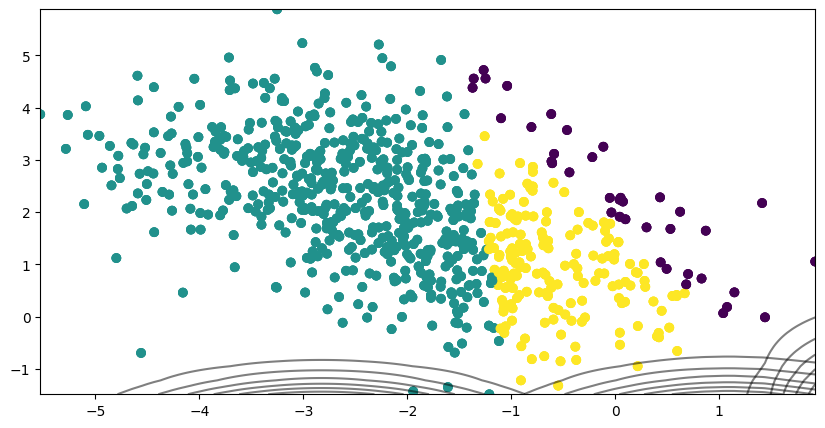

loglikelihood value: -2387.8909376392417


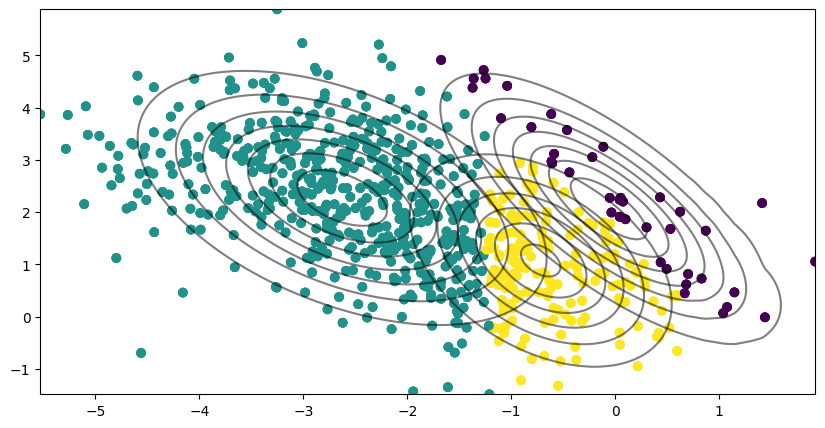

loglikelihood value: -2380.6860768372208


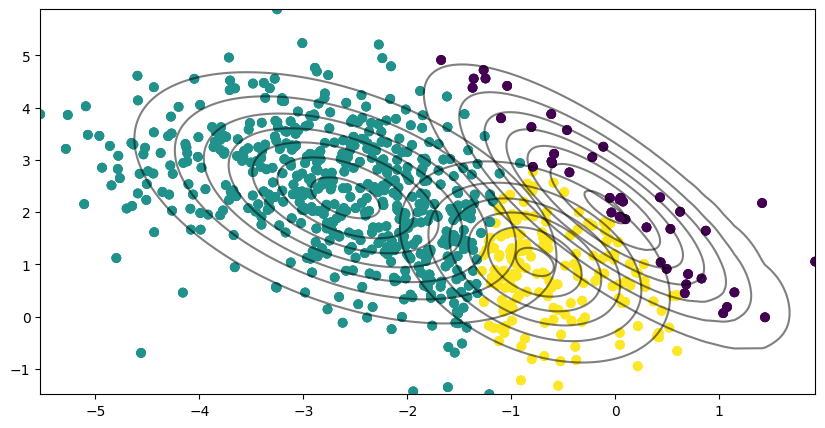

loglikelihood value: -2376.9217043475483


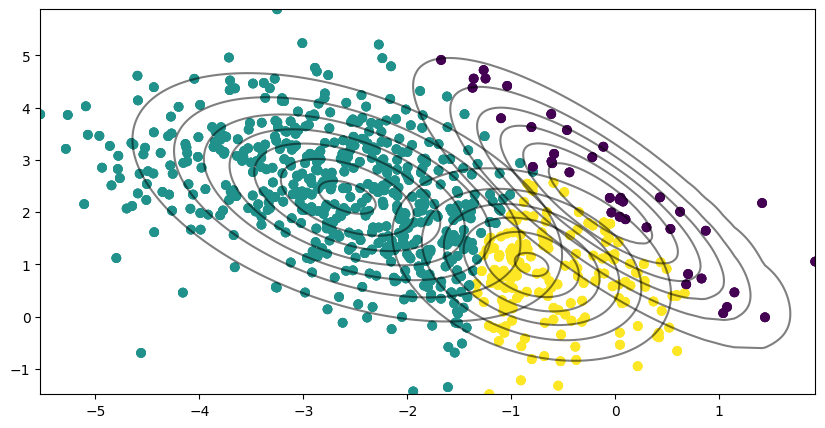

loglikelihood value: -2374.3462722730114


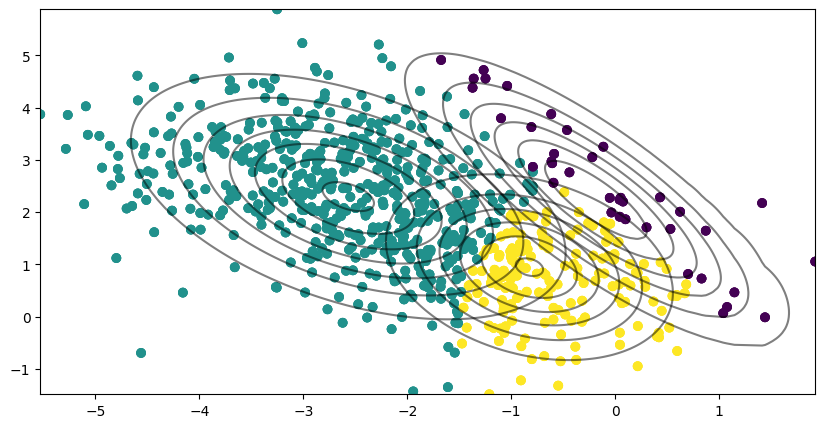

loglikelihood value: -2372.409646830509


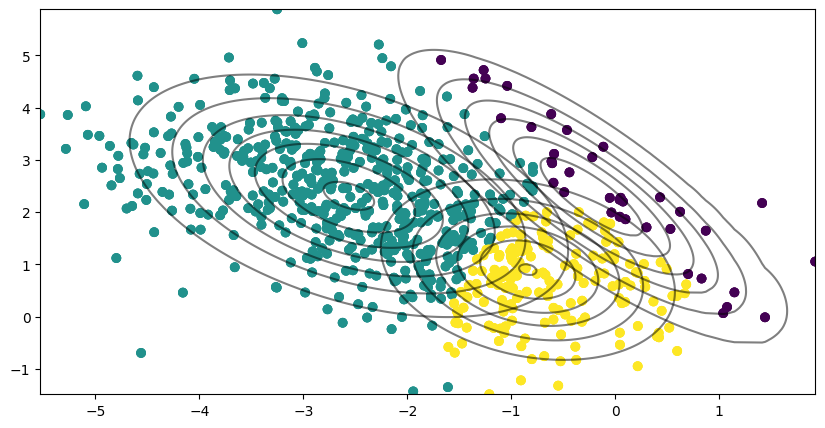

loglikelihood value: -2370.8848921614513


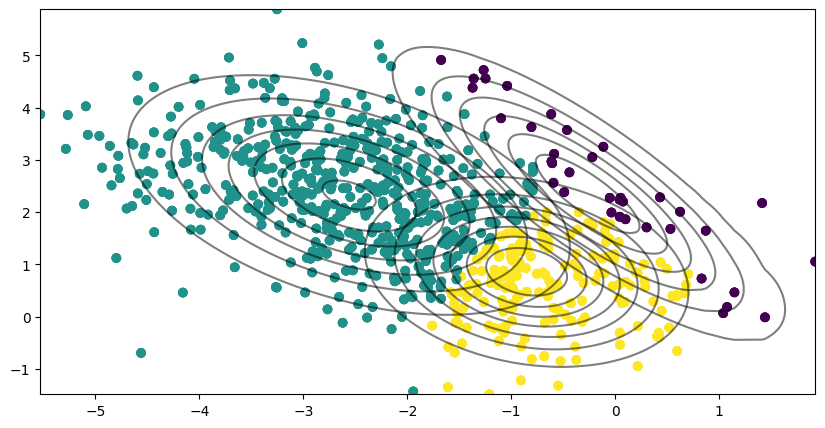

loglikelihood value: -2369.6580683124416


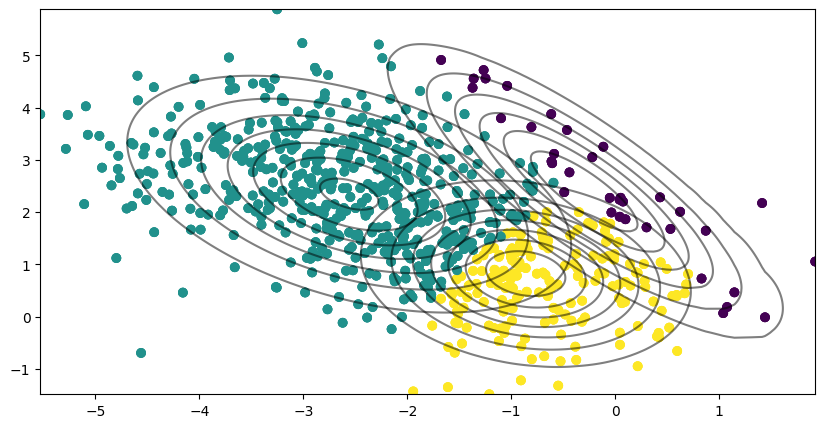

loglikelihood value: -2368.6648961679925


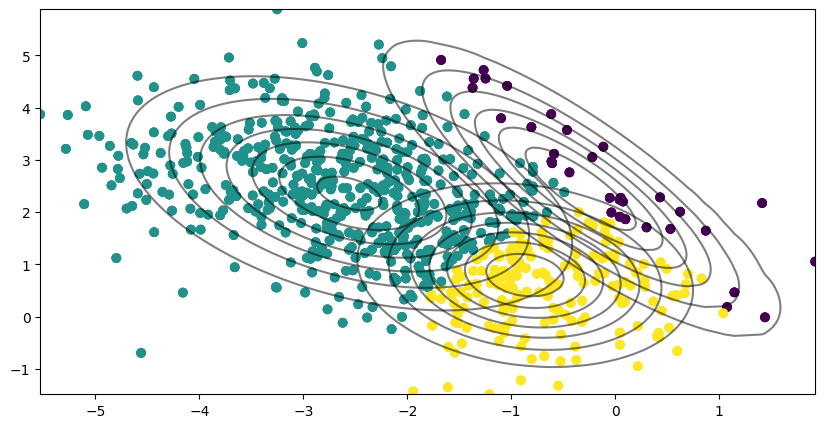

loglikelihood value: -2367.857952049369


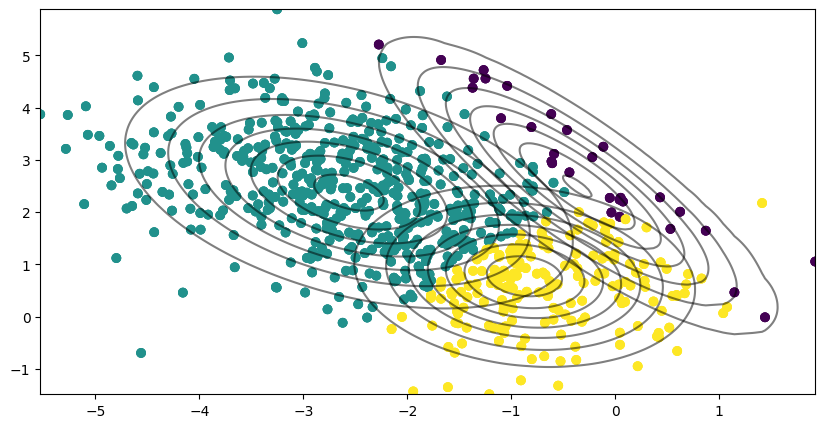

loglikelihood value: -2367.1907537309576


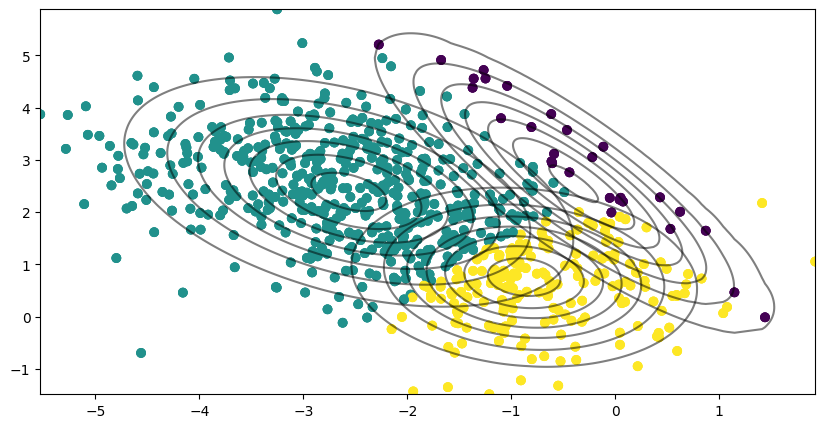

loglikelihood value: -2366.6166929287187


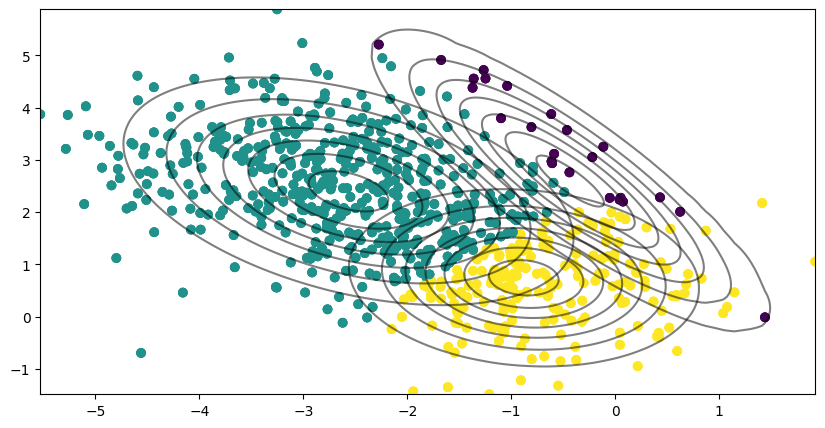

loglikelihood value: -2366.0976628754324


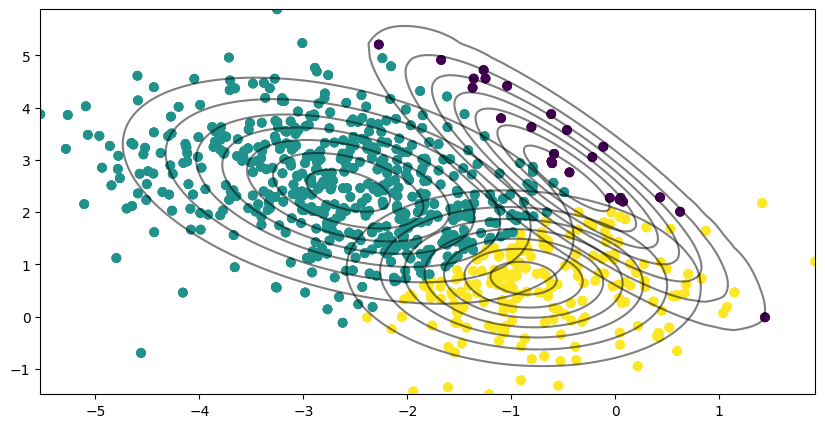

loglikelihood value: -2365.6167941101394


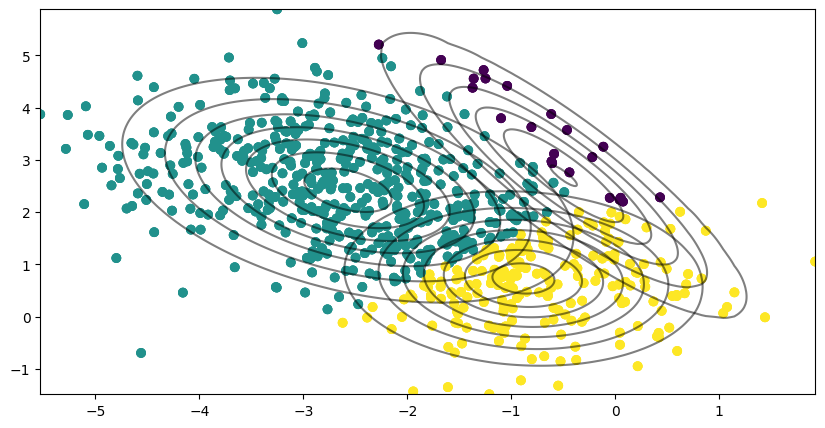

loglikelihood value: -2365.1812356250284


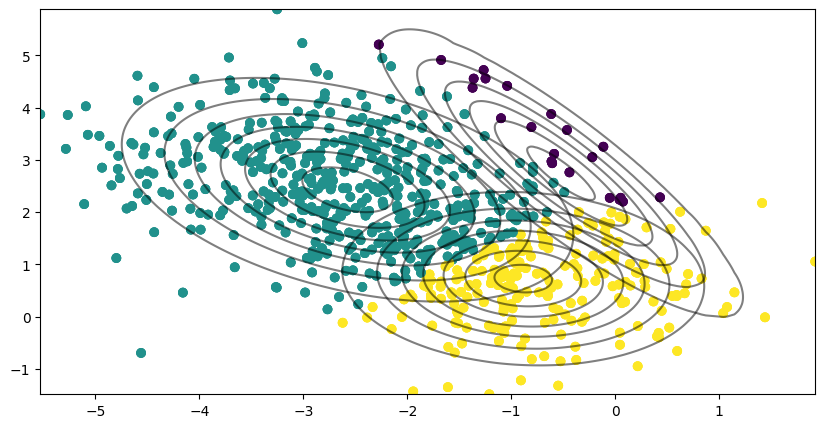

loglikelihood value: -2364.8017162048927


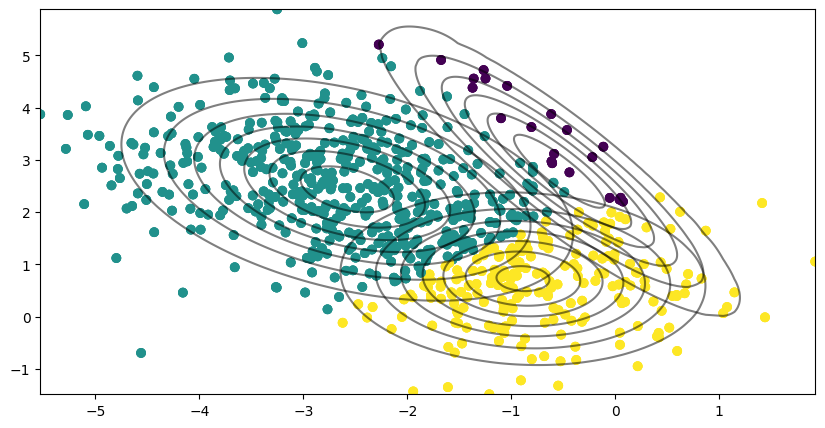

loglikelihood value: -2364.4756261596567


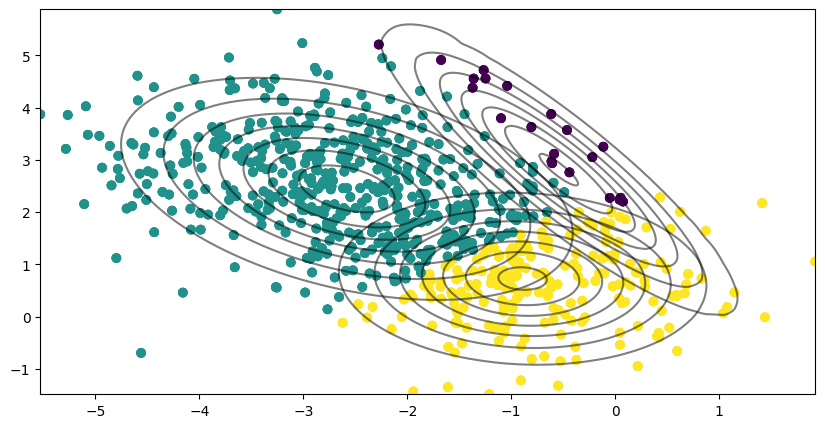

loglikelihood value: -2364.1942609321604


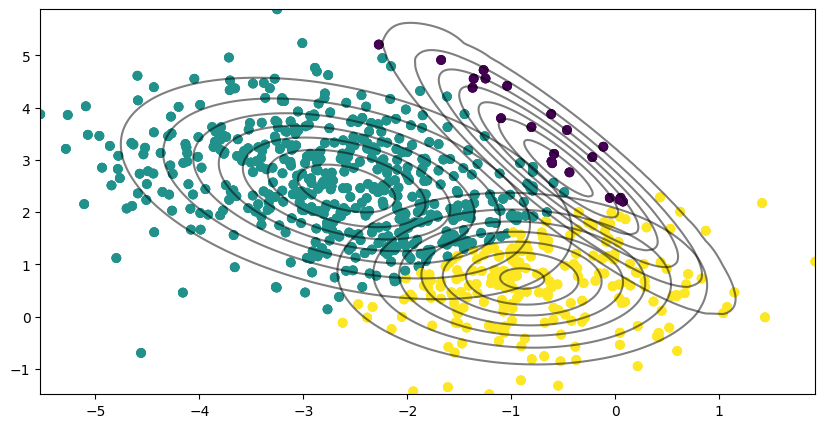

loglikelihood value: -2363.950774513901


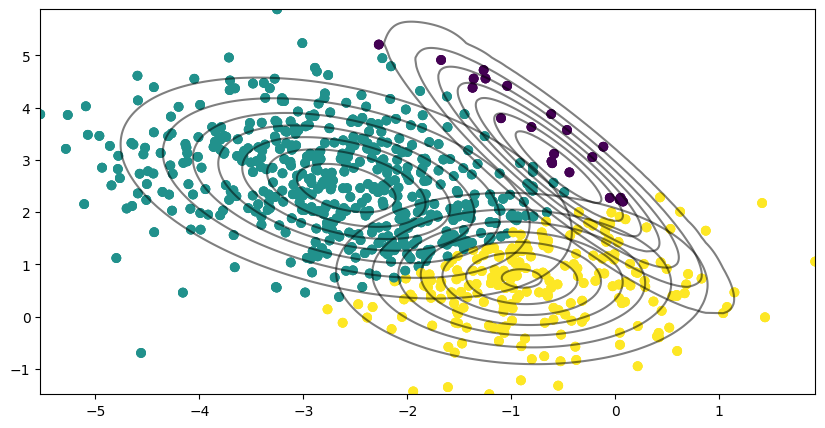

loglikelihood value: -2363.739723764561


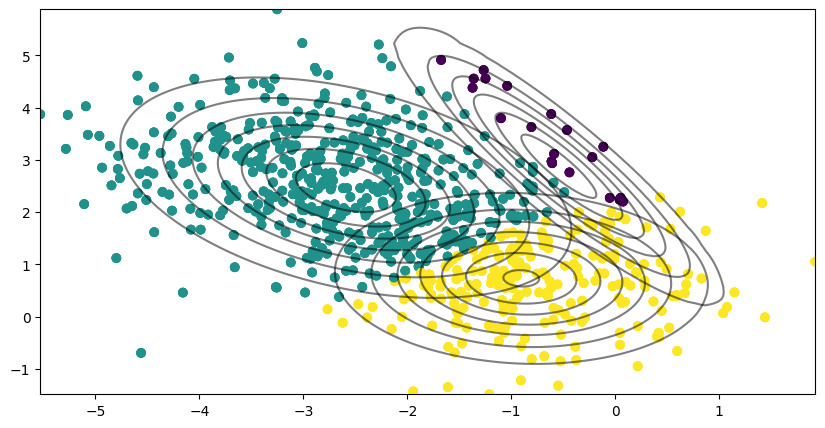

loglikelihood value: -2363.5555540362166


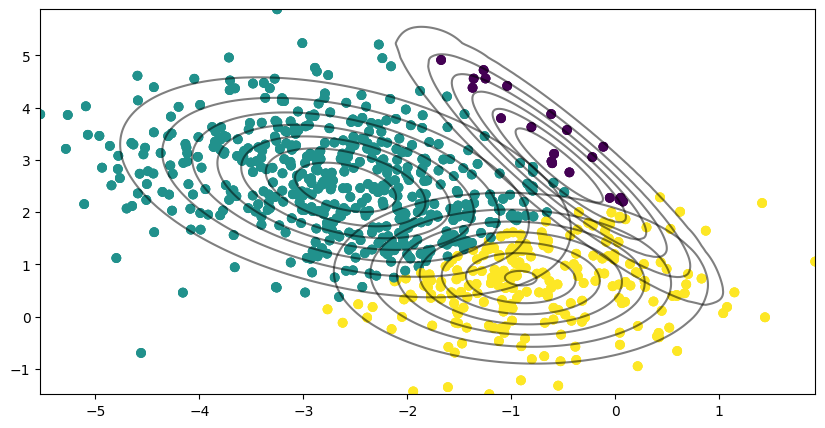

loglikelihood value: -2363.3927257127857


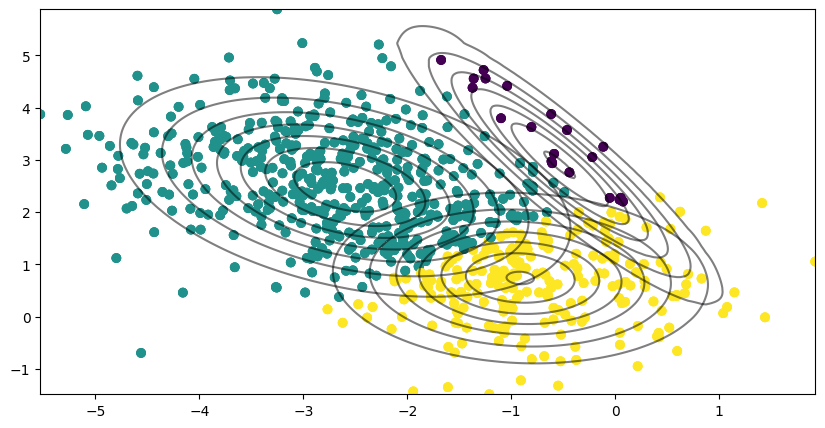

loglikelihood value: -2363.2463598085333


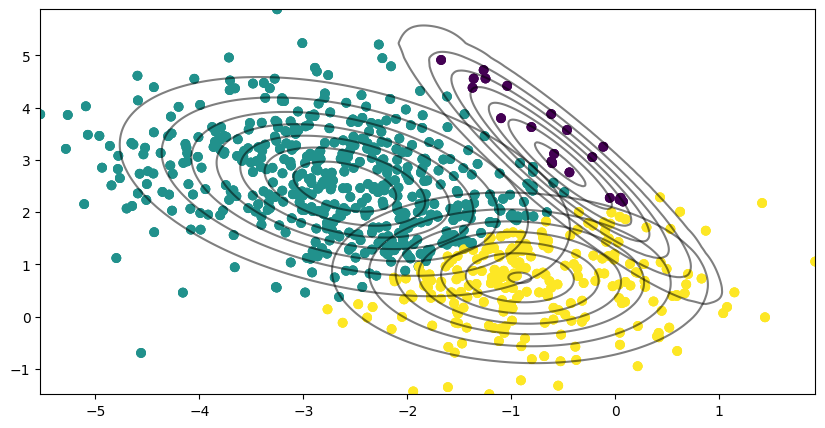

loglikelihood value: -2363.112552679733


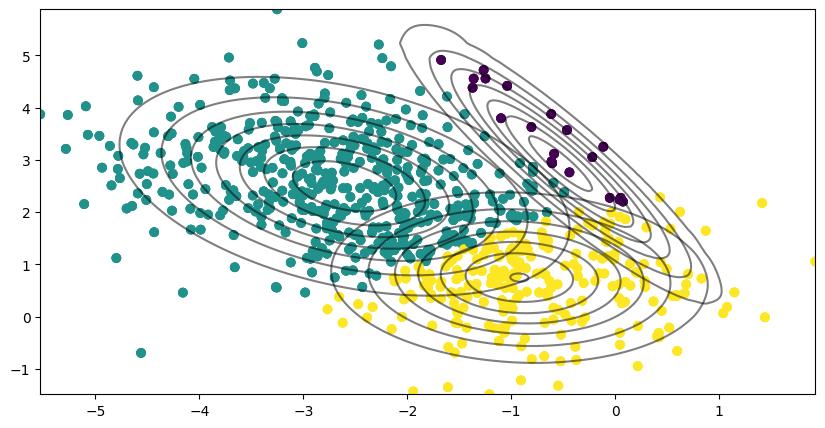

loglikelihood value: -2362.988344348543


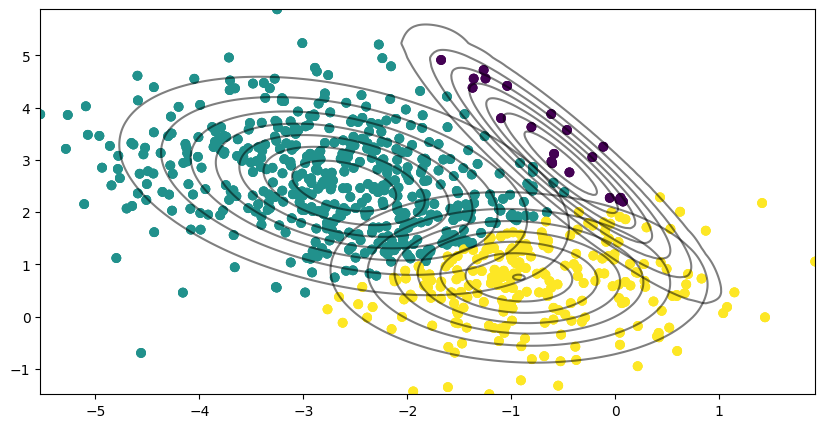

Final Value of pi: [0.0295512  0.66517309 0.30527571]
Final values of Mu: [[-0.51939426  2.94512158]
 [-2.61079197  2.50785597]
 [-0.92986295  0.75728275]]
Final values of Sigma: [[[ 0.57044601 -0.91126579]
  [-0.91126579  1.73486303]]

 [[ 1.13497304 -0.40957928]
  [-0.40957928  1.0579422 ]]

 [[ 0.84666851 -0.06696621]
  [-0.06696621  0.68443852]]]


In [125]:
# All imports
import numpy as np
import pandas as pd
import random as rand
import matplotlib.pyplot as plt
from scipy.stats import norm, multivariate_normal
import sys
import math

##########################################
# Part-6)-b: Implementation of Expectation-Maximization (EM) algorithm
##########################################

############################################################################
# Write a function to compute the log-likelihood of the data given the parameters
############################################################################
def likelihood(data, pi, mu, sigma, log_likelihood=False, likelihoods=False):
    likelihood = 0
    for n in range(len(data)):
        data_likelihood = 0
        for k in range(len(pi)):
            data_likelihood += pi[k] * multivariate_normal.pdf(data[n], mu[k], sigma[k])
        likelihood += np.log(data_likelihood)
        if likelihoods:
            likelihoods.append(data_likelihood)
    if log_likelihood:
        return likelihood
    else:
        return np.exp(likelihood)

############################################################################
# Write a function for the expectation step
############################################################################
def expectation(data, pi, mu, sigma):
    gamma = np.zeros((len(data), len(pi)))
    for n in range(len(data)):
        for k in range(len(pi)):
            numerator = pi[k] * multivariate_normal.pdf(data[n], mu[k], sigma[k])
            denominator = sum(pi[j] * multivariate_normal.pdf(data[n], mu[j], sigma[j]) for j in range(len(pi)))
            gamma[n, k] = numerator / denominator
    return gamma

############################################################################
# Write a function for the maximization step
############################################################################
def maximization(data, gamma):
    Nk = np.sum(gamma, axis=0)
    pi = Nk / len(data)
    mu = np.dot(gamma.T, data) / Nk[:, np.newaxis]
    sigma = np.zeros((len(pi), data.shape[1], data.shape[1]))
    for k in range(len(pi)):
        diff = data - mu[k]
        sigma[k] = np.dot((gamma[:, k] * diff.T), diff) / Nk[k]
    return pi, mu, sigma
############################################################################
#Part C : Plotting the contours
############################################################################
# Complete the below function. It plots the contours
def plot_contours(data, labels, pi, mu, sigma):
    x, y = np.meshgrid(np.sort(data[:,0]), np.sort(data[:,1]))
    xy = np.array([x.flatten(), y.flatten()]).T
    plt.figure(figsize=(10,5))
    for i in range(len(pi)):
        plt.contour(x, y, multivariate_normal.pdf(xy, mu[i], sigma[i]).reshape(len(data), len(data)), colors='black', alpha=0.5)
        plt.scatter(data[:,0], data[:,1],c=labels, cmap='viridis')
    plt.show()
############################################################################
# Run the expectation and maximization algorithm to estimate the parameters
############################################################################
data = np.concatenate([np.random.multivariate_normal([-1,1], [[1, 0], [0, 1]], 250),
                       np.random.multivariate_normal([-2, 2], [[1, -0.5], [-0.5, 1]], 250),
                       np.random.multivariate_normal([-3, 3], [[1, 0], [0, 1]], 250)])

N = data.shape[0] # Number of input examples
D = data.shape[1]  # Data dimension
M = 3  # Number of components in GMM

# Initialize the prior probabilities
pi = np.ones(M) / M
# Initialize the mean vectors
mu = np.random.rand(M, D)*10-5
# Initialize the covariance matrices
sigma = np.array([np.eye(D) for _ in range(M)])

nsteps = 25  # Number of steps to run EM algorithm
for index in range(nsteps):
    # Compute the likelihood
    ll = likelihood(data, pi, mu, sigma, log_likelihood=True)
    print("loglikelihood value:",ll)
    labels = np.argmax(expectation(data, pi, mu, sigma), axis=1)
    # Plot the contours
    plot_contours(data, labels, pi, mu, sigma)

    # Expectation step
    gamma = expectation(data, pi, mu, sigma)

    # Maximization step
    pi, mu, sigma = maximization(data, gamma)
    if np.abs(ll - 0) < 1:
        break
    else:
        prev_ll = ll
print("Final Value of pi:",pi)
print("Final values of Mu:",mu)
print("Final values of Sigma:",sigma)

GMM Data with  Spherical covariance matrix


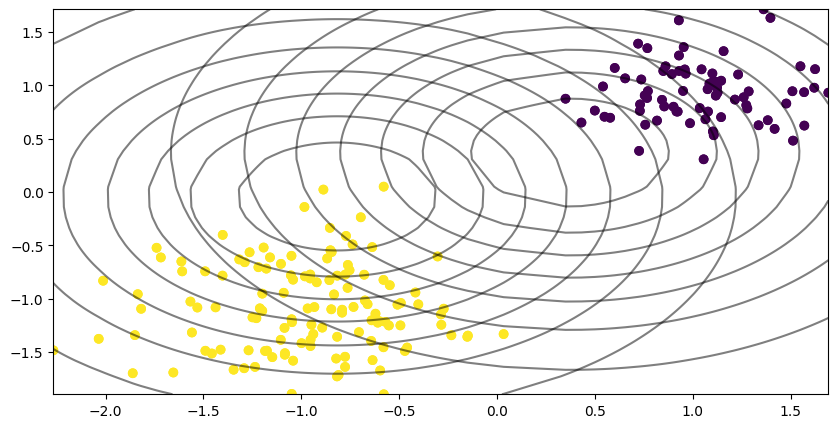

Iteration 1, Log-Likelihood: 7.595001287754965e-182


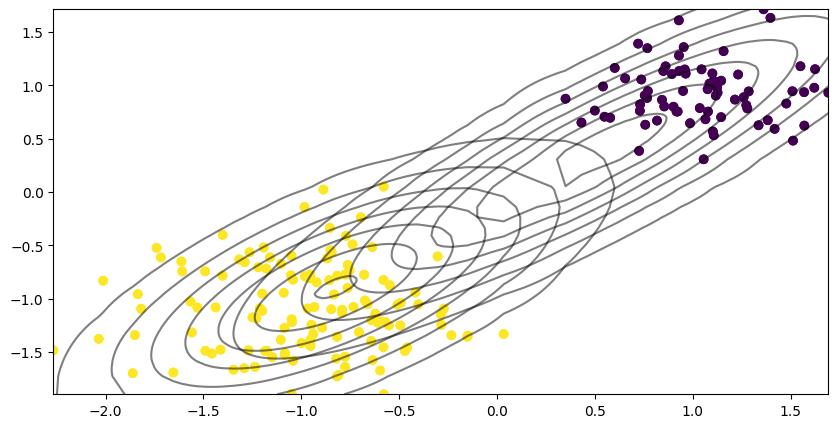

Iteration 6, Log-Likelihood: 4.366139470638447e-165


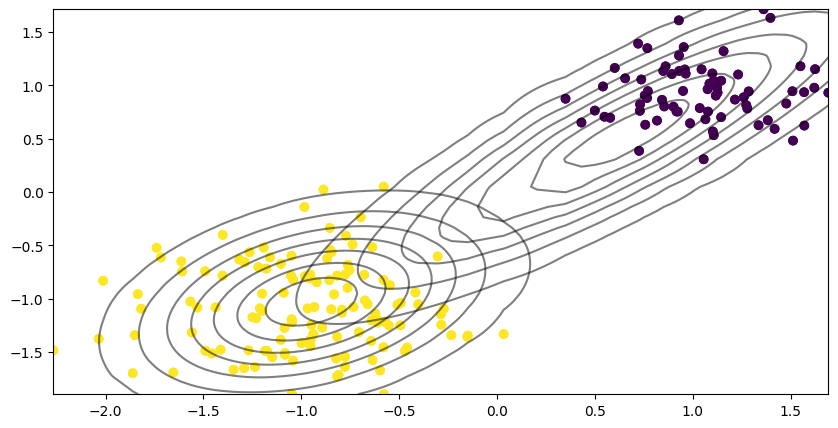

Iteration 11, Log-Likelihood: 3.023965486091647e-151


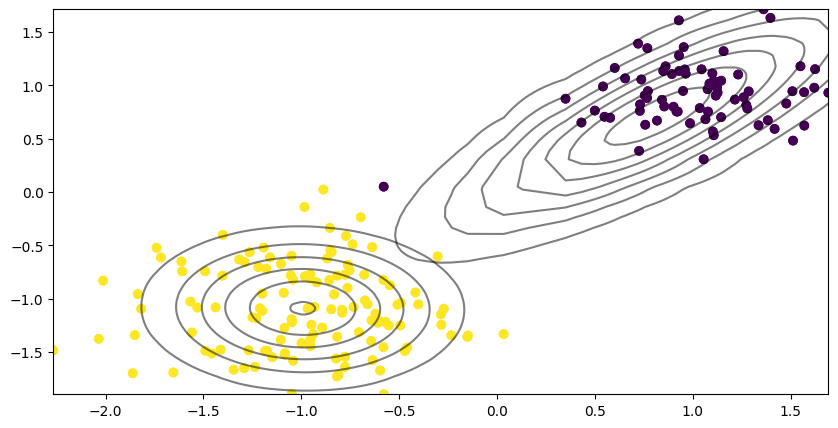

Iteration 16, Log-Likelihood: 1.9192443493884892e-137


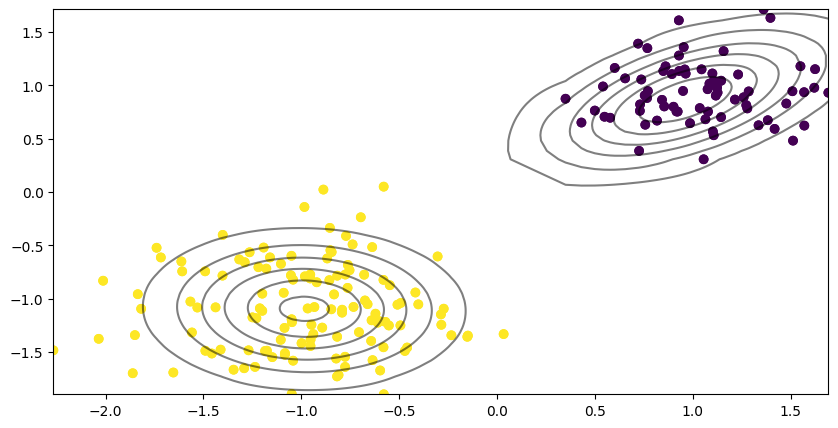

Iteration 21, Log-Likelihood: 1.335490692424457e-128

---------------------------------------------

GMM Data with  Diagonal covariance matrix


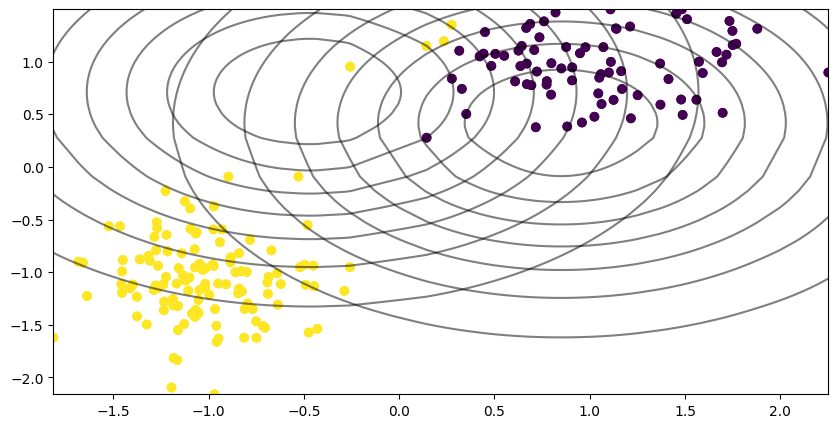

Iteration 1, Log-Likelihood: 3.8346884832826945e-188


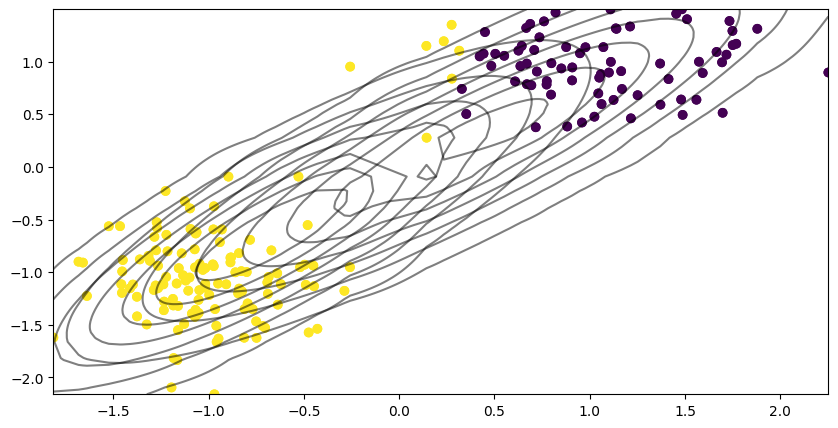

Iteration 6, Log-Likelihood: 1.3916146303262909e-185


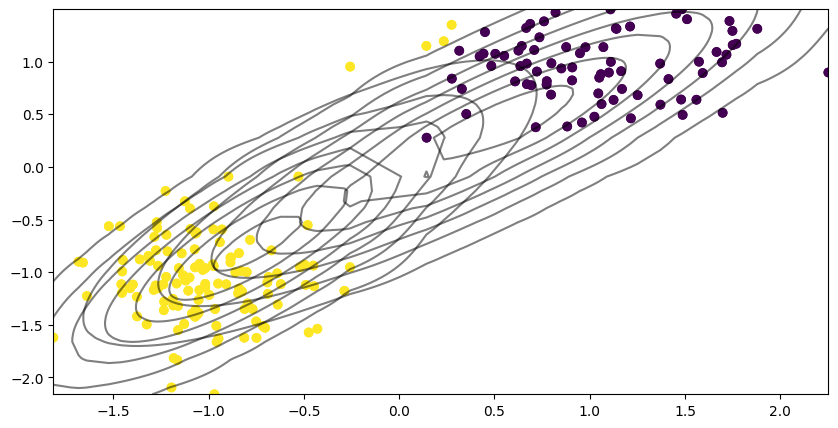

Iteration 11, Log-Likelihood: 1.092027076086834e-180


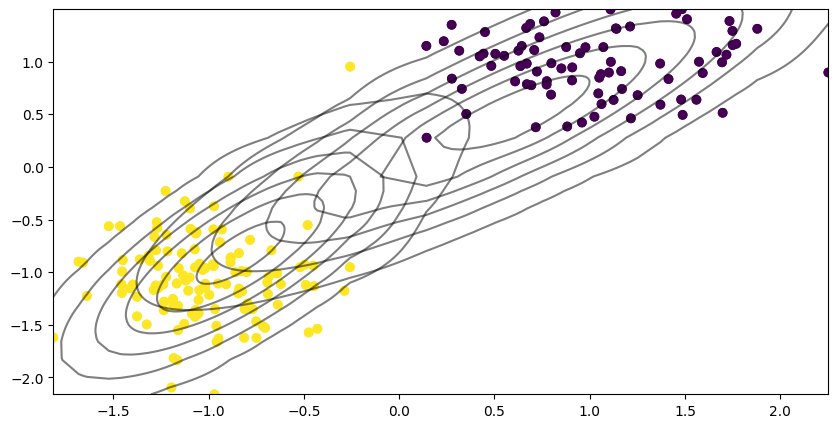

Iteration 16, Log-Likelihood: 4.142670299120151e-167


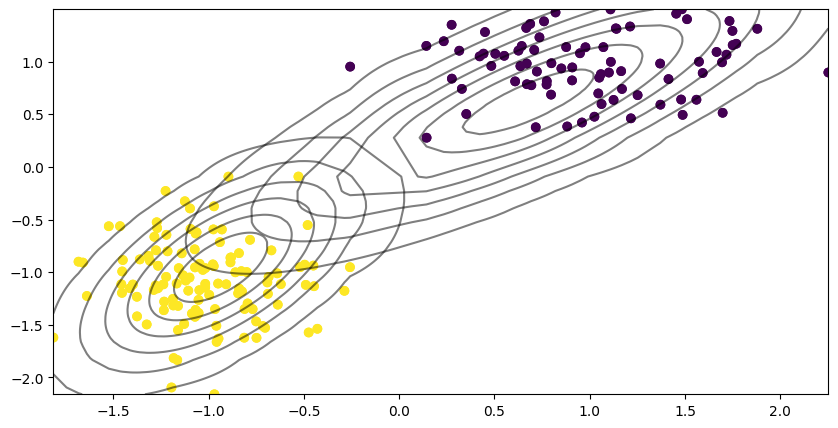

Iteration 21, Log-Likelihood: 2.299591612026774e-139

---------------------------------------------

GMM Data with  Full covariance matrix


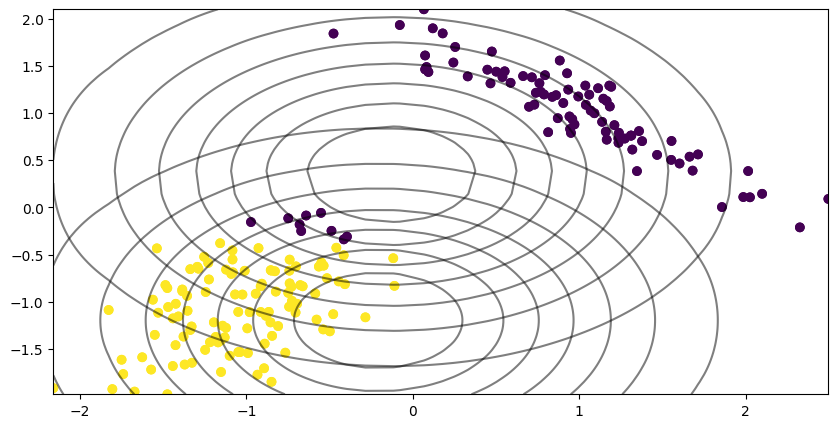

Iteration 1, Log-Likelihood: 1.9242055653597182e-208


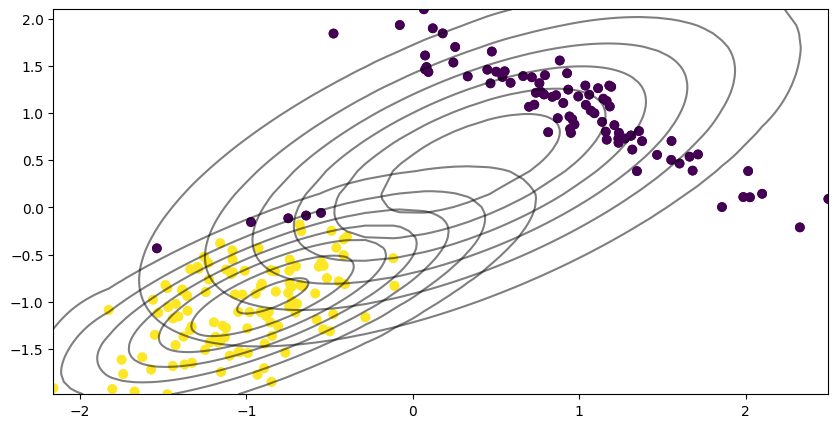

Iteration 6, Log-Likelihood: 7.38422037584231e-191


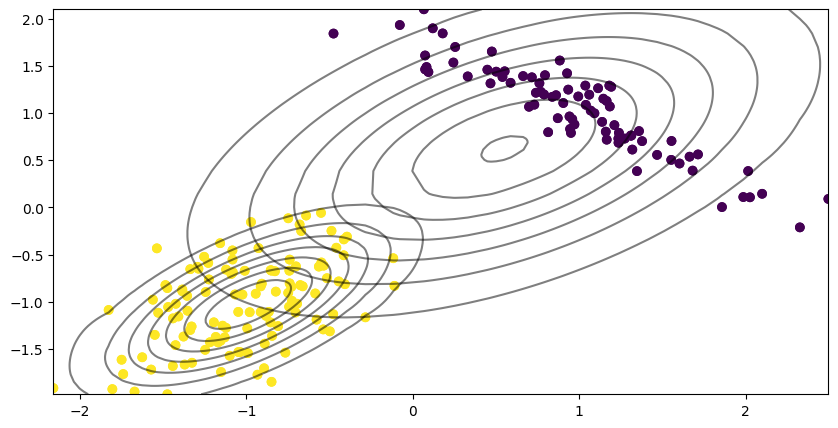

Iteration 11, Log-Likelihood: 2.459366520032168e-177


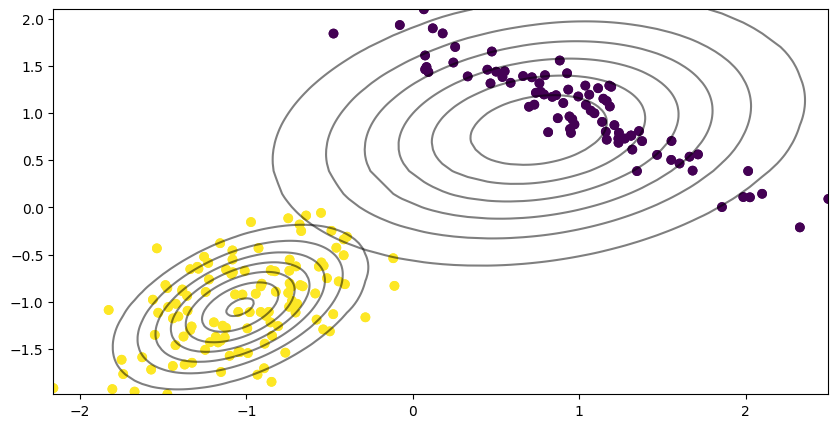

Iteration 16, Log-Likelihood: 3.683782644523094e-156


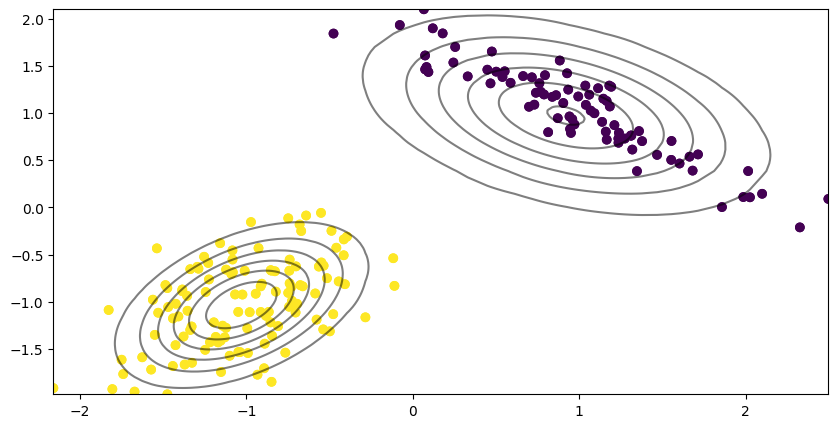

Iteration 21, Log-Likelihood: 5.238465752349484e-131


In [131]:
# All imports
import numpy as np
import pandas as pd
import random as rand
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal
import sys
import math

##########################################
# Part-6)-d: Understanding the issues with EM algorithm
##########################################
# Run the expectation and maximization algorithm to estimate the parameters
def run_EM_algorithm(data, n_components, n_steps):
    n_samples, n_features = data.shape 
    sigma=np.array([np.eye(n_features) for _ in range(n_components)])
    # Initialize parameters based on given initialization
    pi = np.ones(n_components) / n_components
    mu = np.random.randn(n_components, n_features)
    sigma = np.array([np.eye(n_features)] * n_components)
    # Iterate EM steps
    for step in range(0,n_steps,5):
        # Expectation step
        gamma = expectation(data, pi, mu, sigma)
        labels = np.argmax(expectation(data, pi, mu, sigma), axis=1)
        plot_contours(data, labels,pi, mu, sigma)
        # Maximization step
        pi, mu, sigma = maximization(data, gamma)
        # Compute log-likelihood
        ll = likelihood(data, pi, mu, sigma)
        print(f"Iteration {step + 1}, Log-Likelihood: {ll}")
        # Plot the contours
        
# Run EM algorithm with different initializations and covariance matrices
print("GMM Data with  Spherical covariance matrix")
run_EM_algorithm(data_sp, n_components=2, n_steps=25)
print("\n---------------------------------------------\n")
print("GMM Data with  Diagonal covariance matrix")
run_EM_algorithm(data_dg, n_components=2, n_steps=25)
print("\n---------------------------------------------\n")
print("GMM Data with  Full covariance matrix")
run_EM_algorithm(data_full, n_components=2, n_steps=25)

<b> Report your observations </b>

1. In 6.b, the GMM is fit with random initialization of mu, identity covariance matrix and initialization ,the fit quality is good as seen from the contour plots.

2. The fiting was becoming good with increase in the steps/iterations.

3. The fit quality is good in the data with full covariance, spherical and diagonal covariances which already created in 6a.
